# Nonlinear buckling analysis of a box beam
This notebook shows the calculation of the nonlinear buckling load of a cantilever box beam under a uniform vertical load using MSC Nastran SOL 106.

* [Geometrical and material properties](#properties)
* [Numerical model](#numerical-model)
* [Mesh convergence study](#mesh-convergence)
* [Nonlinear buckling analyses](#nonlinear-buckling)
    * [Box beam with rigid tip section](#disrtibuted-load-rigid-tip)
    * [Box beam loaded with concentrated tip load](#concentrated-load)
        * [Free tip section](#free-tip)
        * [Rigid tip section](#rigid-tip)

## Geometrical and material properties <a name="properties"></a>
We consider an untapered box beam with the following geometry.

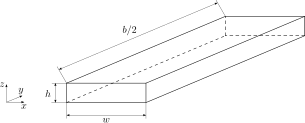

In [74]:
from IPython.display import SVG
SVG(filename='BoxBeamGeometry.svg')

We define the geometric properties of our box beam trying to obtain a scaled imitation of the CRM. For this reason we use an aspect ratio $b/w=9$ and a non-dimensional height $h/w=0.2$. For the wall thickness we use a 1/50 ratio with respect to the height of the cross-section, in order to obtain a thin-walled structure. The width $w$ is set to 1 m and the other dimensions follow from that.

In [75]:
AR = 9. # aspect ratio - b/w
w = 1e3 # width [mm]
b = AR*w # span [mm]
non_dimensional_height = 0.2 # h/w
h = w*non_dimensional_height # box height [mm]
non_dimensional_thickness = 1/50 # t/h
t = h*non_dimensional_thickness # shell thickness [mm]
print(f'Box beam dimensions\n Width: {w/1e3:.1f} m\n Semispan: {b/2/1e3:.1f} m\n Height: {h/1e3:.1f} m\n Wall thickness: {t:.1f} mm')

Box beam dimensions
 Width: 1.0 m
 Semispan: 4.5 m
 Height: 0.2 m
 Wall thickness: 4.0 mm


Next we define the material properties of our box beam. The values used here are taken from the [paper on the development of the undeflected CRM](https://arc.aiaa.org/doi/10.2514/1.J056603).

In [76]:
rho = 2780e-12 # density [ton/mm^3]
E = 73.1e3 # Young's modulus [MPa]
nu = 0.3 # Poisson's ratio

## Numerical model <a name="numerical-model"></a>
Now we define a function to generate a base Nastran FE model of our box beam using the `pyNastran` package. This base FE model includes material properties, element properties, mesh, boundary conditions and applied forces, and it will be completed each time according to the analysis to be performed. The boundary conditions are defined fixing the nodes along the root section of the box beam. A total load of 1 N is applied to the structure defining an upward force at each node of the top surface. In this way, the magnitude of the total load can be easily scaled as needed.

The fuction takes as input material properties, geometrical properties and the desired length of the shell elements and returns a `BDF` object and the number of degrees of freedom of the model. The `BDF` object represents the input file for Nastran, where the model of the box beam is defined. The function takes care of discretizing the faces of the box beam into nodes and quadrilateral elements and adds several Nastran cards to the `BDF` object.
 - MAT1 card to define an isotropic material. The field corresponding to the shear modulus $G$ is left blank. This is automatically calculated as follows:
$$E=2(1+\nu)G.$$
 - PSHELL card to define the properties of the shell elements.
 - GRID and CQUAD4 cards to define nodes and shell elements.
 - SPC1 card to define the boundary conditions.
 - FORCE cards to define the distributed load applied over the top surface.
 - Various parameters for the post-processing of the results and for the definition of the global subcase.

In [77]:
from pyNastran.bdf.bdf import BDF
import numpy as np

def generate_fe_model(youngs_modulus, poission_ratio, density, shell_thickness, width, span, height, cquad4_length):
    # Create BDF object
    bdf_input = BDF(debug=False)
    # Add material card
    mid = 1
    bdf_input.add_mat1(mid, youngs_modulus, G='', nu=poission_ratio, rho=density)
    # Add element property card
    pid = 1
    bdf_input.add_pshell(pid, mid1=mid, t=shell_thickness, mid2=mid, mid3=mid)
    # Define coordinates of the vertices of the box based on the input geometrical properties
    vertices_xyz = np.array([(0., 0., height/2),   # 0
                           (width, 0., height/2),    # 1
                           (width, 0., -height/2),  # 2
                           (0., 0., -height/2),   # 3
                           (0., span/2, height/2),  # 4
                           (width, span/2, height/2),   # 5
                           (width, span/2, -height/2), # 6
                           (0., span/2, -height/2)]) # 7
    # Define faces by sequence of points
    faces = [[0,1,5,4], [1,2,6,5], [2,3,7,6], [3,0,4,7]]
    # Define number of nodes along the span of the box
    no_nodes_span = int(np.ceil((np.linalg.norm(vertices_xyz[4] - vertices_xyz[0])/cquad4_length)))
    # Initialize array with the nodes' ids
    nodes_ids = np.empty((no_nodes_span, 0), dtype=int)
    # Initialize variable with id of last defined node
    last_node_id = 0
    # Initailize list with the column indices of the node_ids array associated with the edges of the box
    edge_indices = []
    # Define nodes of the mesh for each face of the box
    for face in faces:
        # Define number of nodes along the width or height of the box
        no_points_chord_height = int(np.ceil((np.linalg.norm(vertices_xyz[face[1]] - vertices_xyz[face[0]])/cquad4_length)))
        # Find coordinates of nodes along the root and the tip of the current face
        root_nodes_xyz = np.linspace(vertices_xyz[face[0]], vertices_xyz[face[1]], no_points_chord_height)
        tip_nodes_xyz = np.linspace(vertices_xyz[face[3]], vertices_xyz[face[2]], no_points_chord_height)
        # Find the coordinates of the nodes along the span of the box for each couple of root-tip points of the current face
        for j in range(no_points_chord_height-1):
            nodes_xyz = np.linspace(root_nodes_xyz[j], tip_nodes_xyz[j], no_nodes_span)
            # Generate ids for current set of nodes
            nodes_ids = np.hstack((nodes_ids, np.arange(last_node_id+1,last_node_id+no_nodes_span+1)[:,None]))
            # Update id of last defined node
            last_node_id = last_node_id + no_nodes_span
            for row in range(no_nodes_span):
                bdf_input.add_grid(nodes_ids[row, -1], nodes_xyz[row])
        # Save column index corresponding to the edge of the current face
        edge_indices.append(np.size(nodes_ids, 1))
    # Add last column of nodes' ids
    nodes_ids = np.hstack((nodes_ids, np.arange(1,no_nodes_span+1)[:,None]))
    # Define shell elements (CQUAD4 cards)
    for row in range(np.size(nodes_ids, 0) - 1):
        for col in range(np.size(nodes_ids, 1)-1):
            bdf_input.add_cquad4(row * np.size(nodes_ids, 0) + col + 1, pid, [nodes_ids[row, col], nodes_ids[row + 1, col], nodes_ids[row + 1, col + 1], nodes_ids[row, col + 1]])
    # Add SPC1 card to constrain all degrees of freedom of nodes at the root section
    spc1_sid = 1
    root_nodes_ids = list(nodes_ids[0,0:-2])
    bdf_input.add_spc1(spc1_sid, '123456', root_nodes_ids)
    # Store number of degrees of freedom
    degrees_of_freedom = (np.size(nodes_ids) - np.size(root_nodes_ids))*6
    # Define id, magnitude and direction of the force cards
    force_sid = spc1_sid+1
    force_magnitude = 1/nodes_ids[:,0:edge_indices[0]].size
    force_direction = [0., 0., 1.]
    # Add a force card for each node of the upper face
    for row in range(np.size(nodes_ids, 0)):
        for j in range(edge_indices[0]+1):
            bdf_input.add_force(sid=force_sid, node=nodes_ids[row, j], mag=force_magnitude, xyz=force_direction)
    # Add PARAM card to store results in a op2 file
    bdf_input.add_param('POST', [1])
    # Generate global subcase and set some defaults
    bdf_input.create_subcases(0)
    bdf_input.case_control_deck.subcases[0].add_integer_type('SPC', spc1_sid) # id of single-point constraint to apply
    bdf_input.case_control_deck.subcases[0].add('ECHO', 'NONE', [], 'STRING-type') # request neither sorted nor unsorted Bulk Data to be printed
    bdf_input.case_control_deck.subcases[0].add_result_type('DISPLACEMENT', 'ALL', ['PLOT']) # store displacement data of all nodes in the op2 file
    bdf_input.case_control_deck.subcases[0].add_result_type('SPCFORCES', 'ALL', ['PLOT']) # store single point constraint forces data in the op2 file
    bdf_input.case_control_deck.subcases[0].add_result_type('OLOAD', 'ALL', ['PLOT']) # store form and type of applied load vector
    # Return BDF object
    return bdf_input, degrees_of_freedom, nodes_ids

For illustration purposes, let's create a model with a shell element size of 50 mm and let's print some statistics about it.

In [78]:
example_box_beam_input = generate_fe_model(E, nu, rho, t, w, b, h, cquad4_length=50)[0]
print(example_box_beam_input.get_bdf_stats())

---BDF Statistics---
SOL None

bdf.loads[2]
  FORCE:   1800

bdf.spcs[1]
  SPC1:    1

bdf.params
  PARAM    : 1

bdf.nodes
  GRID     : 3960

bdf.elements
  CQUAD4   : 3916

bdf.properties
  PSHELL   : 1

bdf.materials
  MAT1     : 1




subcase=0 already exists...skipping


## Mesh convergence study <a name="mesh-convergence"></a>
In order to use a proper mesh size for our analyses, we need to perform a mesh convergence study. Since we want to study the buckling behavior of the box beam, we assess the convergence of the mesh monitoring the change in the predicted linear buckling load as the mesh is refined. For this purpose we define a function that calculates the linear buckling load taking as input a `BDF` object. This functions performs the following steps in order.
- Assigns solution sequence 105 to the input `BDF` object.
- Creates the first subcase, where a static load of 1 N is applied to the structure.
- Adds an `EIGRL` card to define the parameters for the eigenvalue calculation and creates the second subcase, where the buckling load is calculated.
- Writes the input file and runs the analysis.
- Reads the results and returns the buckling load.

The function also plots the first buckling shape if the input variable `plot_shape` is set to `True`.

In [79]:
import utils
import os
from pyNastran.op2.op2 import read_op2
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d.art3d import Poly3DCollection
import matplotlib as mpl

def calculate_linear_buckling_load(bdf_input, plot_shape=False):
    # Set solution sequence for linear buckling analysis (SOL 105)
    bdf_input.sol = 105
    # Set title of the analysis
    bdf_input.case_control_deck.subcases[0].add('TITLE', 'Linear buckling analysis', [], 'STRING-type')
    # Define load magnitude and id
    load_magnitude = 1. # [N]
    load_sid = 10
    # Find id of last set of FORCE cards added to the BDF object
    force_sid = [*bdf_input.loads][-1]
    # Add LOAD card
    bdf_input.add_load(load_sid, scale=1., scale_factors=[load_magnitude], load_ids=[force_sid])
    # Create first subcase for the application of the static load
    load_application_subcase_id = 1
    utils.create_static_load_subcase(bdf_input, subcase_id=load_application_subcase_id, subtitle='Application of uniform vertical load', load_sid=load_sid)
    # Add EIGRL card to define the parameters for the eigenvalues calculation
    eigrl_sid = load_sid+1
    bdf_input.add_eigrl(eigrl_sid, 0., nd=1)
    # Create second subcase for the calculation of the eigenvalues
    eigenvalue_calculation_subcase_id = 2
    bdf_input.create_subcases(eigenvalue_calculation_subcase_id)
    bdf_input.case_control_deck.subcases[eigenvalue_calculation_subcase_id].add('SUBTITLE', 'Calculation of buckling eigenvalues', [], 'STRING-type')
    bdf_input.case_control_deck.subcases[eigenvalue_calculation_subcase_id].add_integer_type('METHOD', eigrl_sid)
    # Define name of analysis directory
    analysis_directory_name = 'LinearBuckling'
    analysis_directory_path = os.path.join(os.getcwd(), analysis_directory_name)
    # Run analysis
    model_name = 'box_beam_linear_buckling'
    utils.run_analysis(analysis_directory_path, bdf_input, model_name, run_flag=True)
    # Read results
    op2_filename = os.path.join(analysis_directory_path, model_name + '.op2')
    op2 = read_op2(op2_filename, debug=False)
    buckling_load = op2.eigenvectors[eigenvalue_calculation_subcase_id].eigr
    # Plot buckling shape if requested
    if plot_shape:
        print(f'Buckling shape:')
        plot_buckling_shape(bdf_input, op2)
    # Return buckling load
    return buckling_load

def plot_buckling_shape(bdf_input, op2_output):
    # Create figure and axes
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    # Initialize list of displacement magnitude and vertices
    displacements = [None]*len(bdf_input.elements)
    vertices = [None]*len(bdf_input.elements)
    # Iterate through the elements of the BDF object
    for count, element in enumerate(bdf_input.elements.values()):
        # Store ids of the nodes as an array
        node_ids = np.array(element.node_ids)
        # Take the average displacement magnitude of each element
        displacements[count] = np.mean(np.apply_along_axis(np.linalg.norm, 1, [*op2_output.eigenvectors.values()][0].data[0, node_ids - 1, 0:3]))
        # Store the coordinates of the nodes of the deformed elements
        vertices[count] = np.vstack([bdf_input.nodes[index].xyz + [*op2_output.eigenvectors.values()][0].data[0, index - 1, 0:3] * 200 for index in node_ids])
    # Create 3D polygons to represent the elements
    pc = Poly3DCollection(vertices, linewidths=.1)
    # Create colormap for the displacement magnitude and normalize values
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.jet)
    m.set_array(displacements)
    m.set_clim(vmin=0, vmax=max(displacements))
    rgba_array = m.to_rgba(displacements)
    # Color the elements' face by the average displacement magnitude
    pc.set_facecolor([(rgb[0], rgb[1], rgb[2]) for rgb in rgba_array])
    # Set the edge color black
    pc.set_edgecolor('k')
    # Add polygons to the plot
    ax.add_collection3d(pc)
    # Set axes label
    ax.set_xlabel('x [mm]')
    ax.set_ylabel('y [mm]', labelpad=50)
    ax.set_zlabel('z [mm]', labelpad=10)
    # Set axes limmits
    x_coordinates = [func(points[:,0]) for points in vertices for func in (np.min, np.max)]
    y_coordinates = [func(points[:,1]) for points in vertices for func in (np.min, np.max)]
    z_coordinates = [func(points[:,2]) for points in vertices for func in (np.min, np.max)]
    ax.set_xlim(min(x_coordinates), max(x_coordinates))
    ax.set_ylim(min(y_coordinates), max(y_coordinates))
    ax.set_zlim(min(z_coordinates), max(z_coordinates))
    # Set aspect ratio of the axes
    ax.set_box_aspect([ub - lb for lb, ub in (getattr(ax, f'get_{a}lim')() for a in 'xyz')])
    # Adjust number of ticks and distance from axes
    plt.locator_params(axis='x', nbins=4)
    plt.locator_params(axis='z', nbins=2)
    ax.tick_params(axis='y', which='major', pad=15)
    # Add colorbar
    fig.colorbar(m, label='Nondimensional displacement magnitude')
    # Show plot
    plt.show()

Now let's calculate the linear buckling load and plot the corresponding shape for the model created earlier.

Buckling shape:


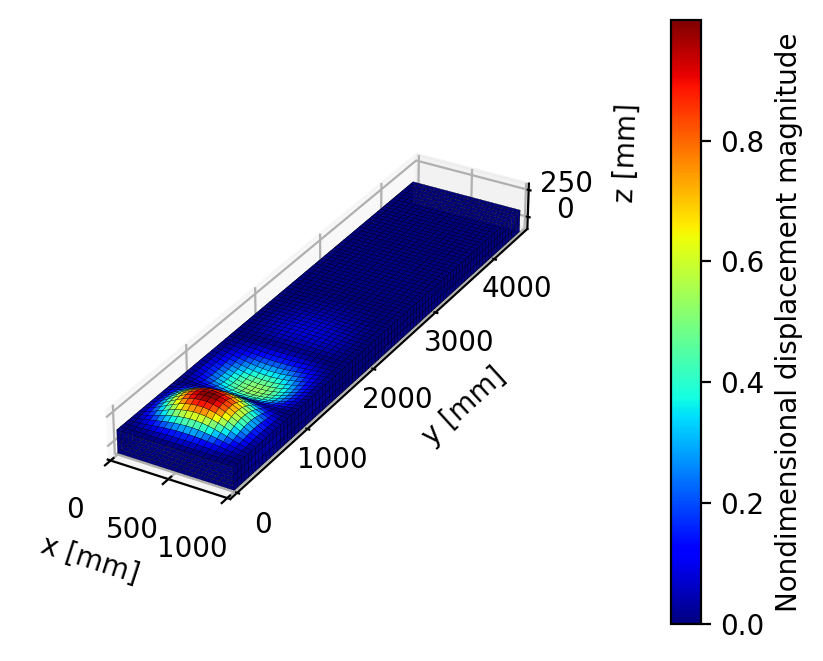

In [80]:
plt.rcParams['figure.dpi'] = 200 # set default dpi of figures
linear_buclking_load = calculate_linear_buckling_load(example_box_beam_input, plot_shape=True)

Now we can run our mesh convergence study. We define 10 different linear sizes of the shell elements, evenly spaced on a log scale between the height of the box beam and double the thickness of the elements. For each shell element size we calculate the linear buckling load and we store the value, together with the number of degrees of freedom of the model.

Approximate linear sizes of shell elements used for mesh convergence study [mm]:
[200.  139.9  97.8  68.4  47.8  33.5  23.4  16.4  11.4   8. ]

Results for model with 1200 degrees of freedom and approximate shell element linear size of 200.0 mm


subcase=0 already exists...skipping


Buckling shape:


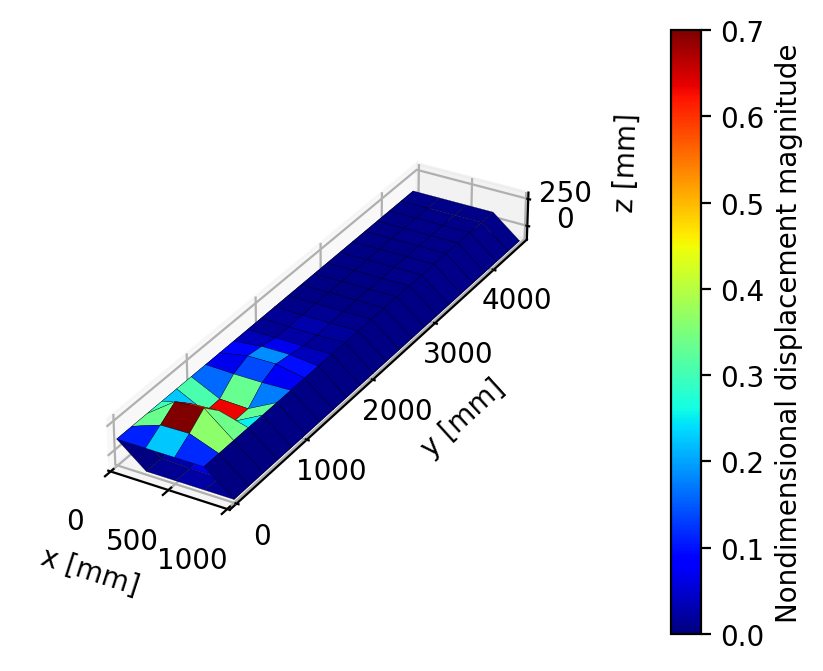

Buckling load: 5284 N

Results for model with 3276 degrees of freedom and approximate shell element linear size of 139.9 mm


subcase=0 already exists...skipping


Buckling shape:


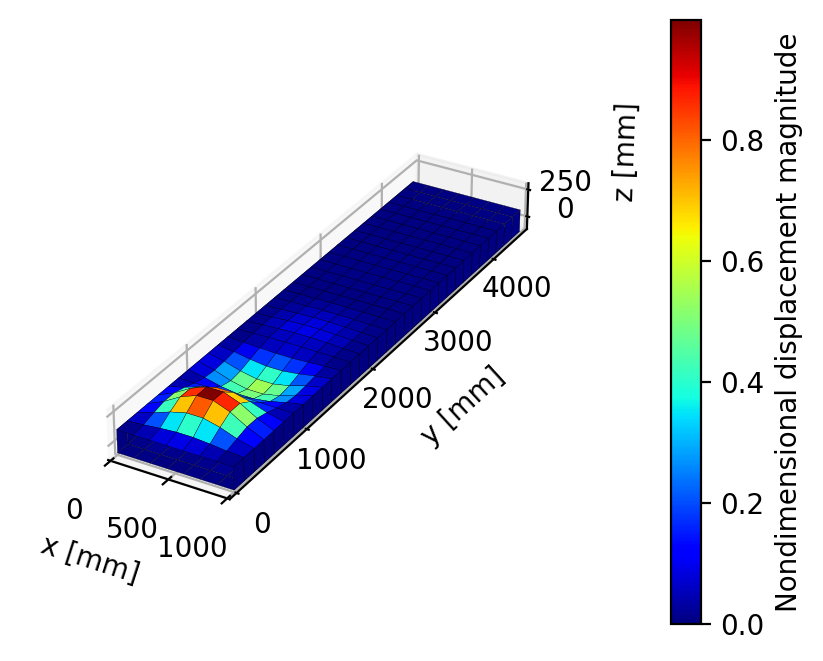

Buckling load: 3605 N

Results for model with 6912 degrees of freedom and approximate shell element linear size of 97.8 mm


subcase=0 already exists...skipping


Buckling shape:


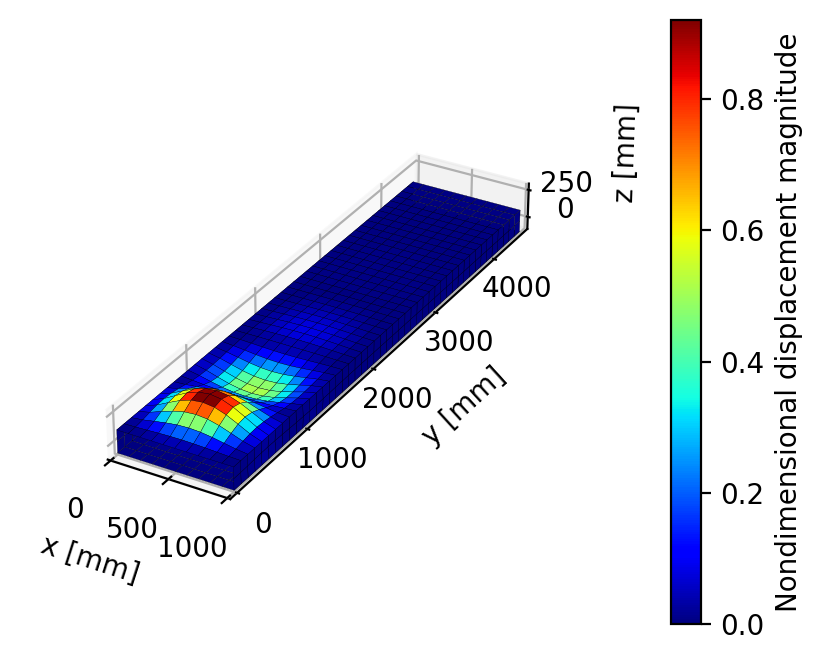

Buckling load: 3574 N

Results for model with 12882 degrees of freedom and approximate shell element linear size of 68.4 mm


subcase=0 already exists...skipping


Buckling shape:


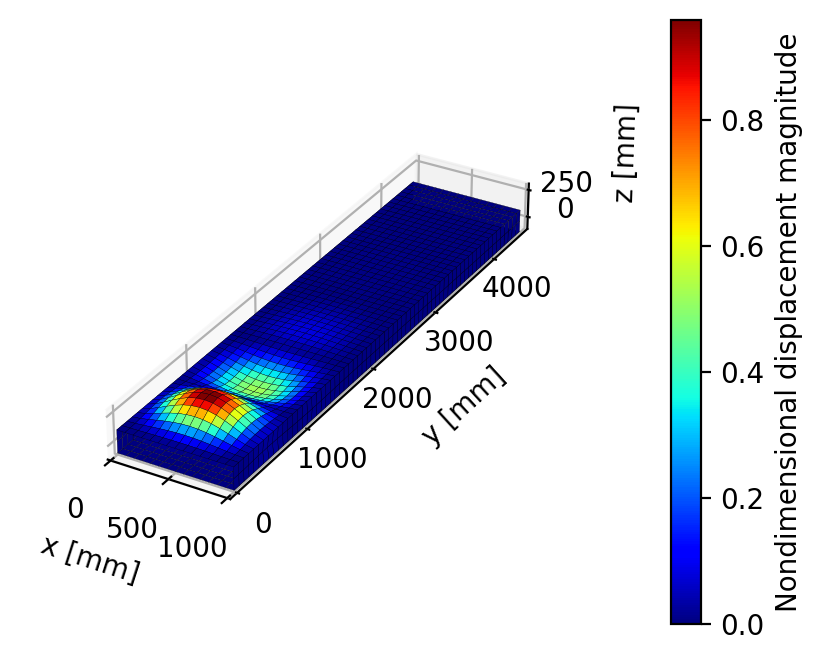

Buckling load: 3651 N

Results for model with 27648 degrees of freedom and approximate shell element linear size of 47.8 mm


subcase=0 already exists...skipping


Buckling shape:


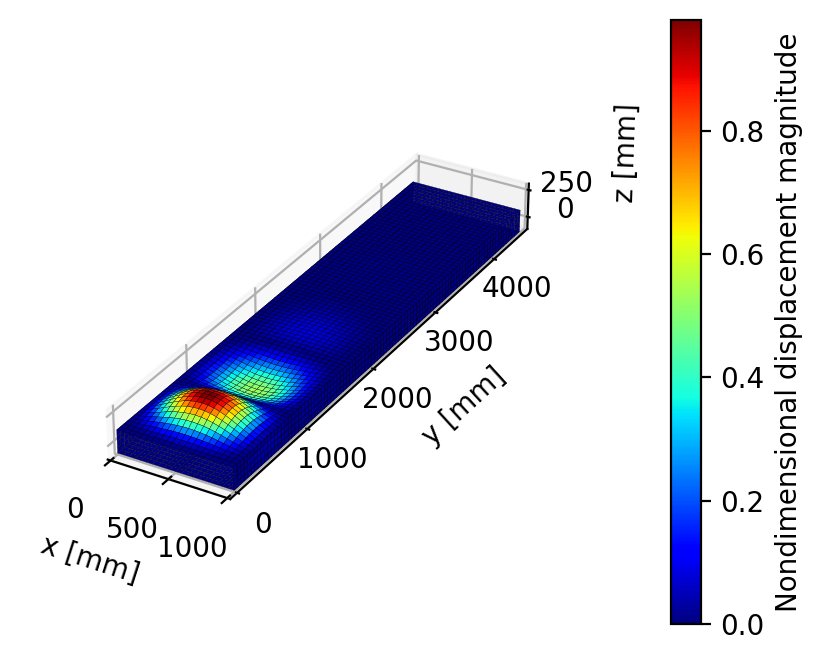

Buckling load: 3719 N

Results for model with 55488 degrees of freedom and approximate shell element linear size of 33.5 mm


subcase=0 already exists...skipping


Buckling shape:


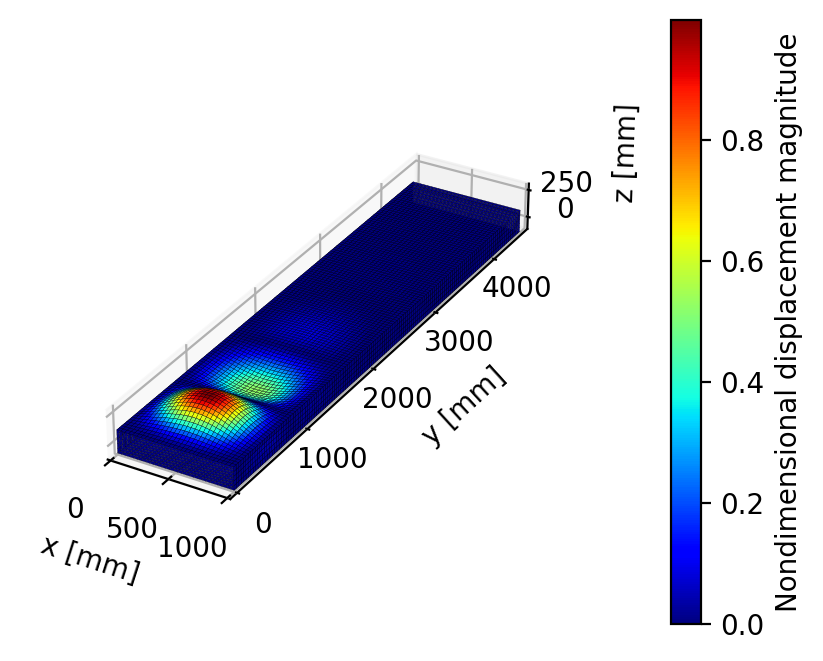

Buckling load: 3780 N

Results for model with 116364 degrees of freedom and approximate shell element linear size of 23.4 mm


subcase=0 already exists...skipping


Buckling shape:


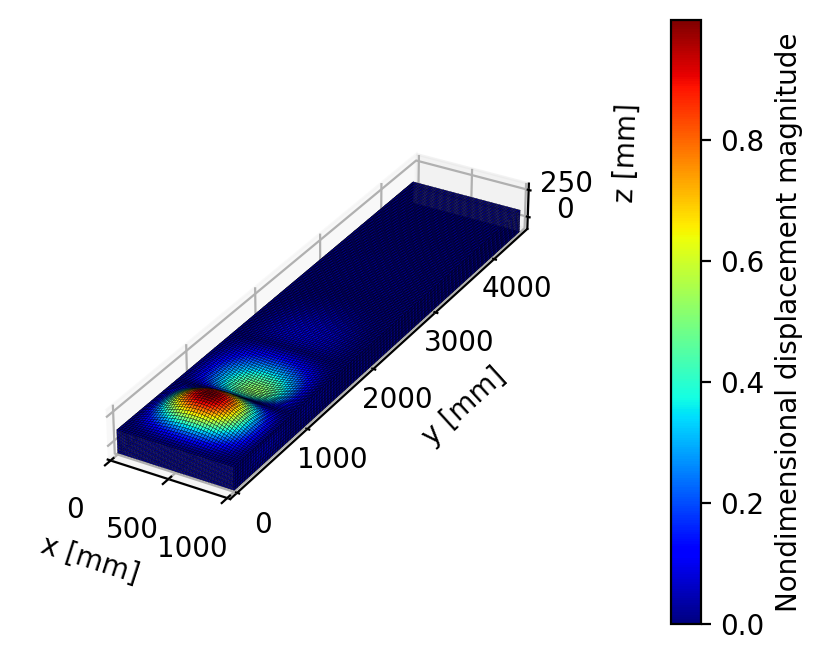

Buckling load: 3824 N


subcase=0 already exists...skipping



Results for model with 242562 degrees of freedom and approximate shell element linear size of 16.4 mm


Buckling shape:


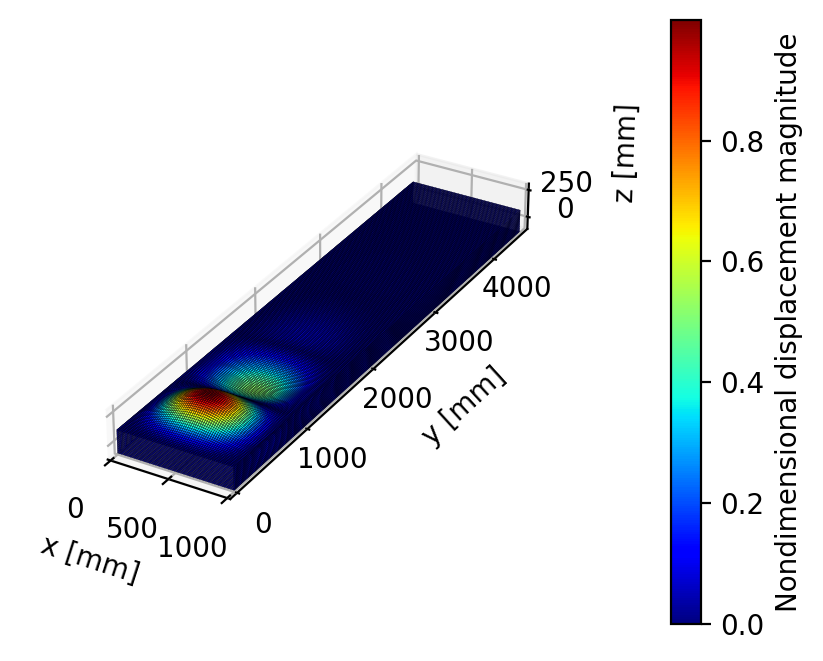

Buckling load: 3855 N


subcase=0 already exists...skipping



Results for model with 492834 degrees of freedom and approximate shell element linear size of 11.4 mm


Buckling shape:


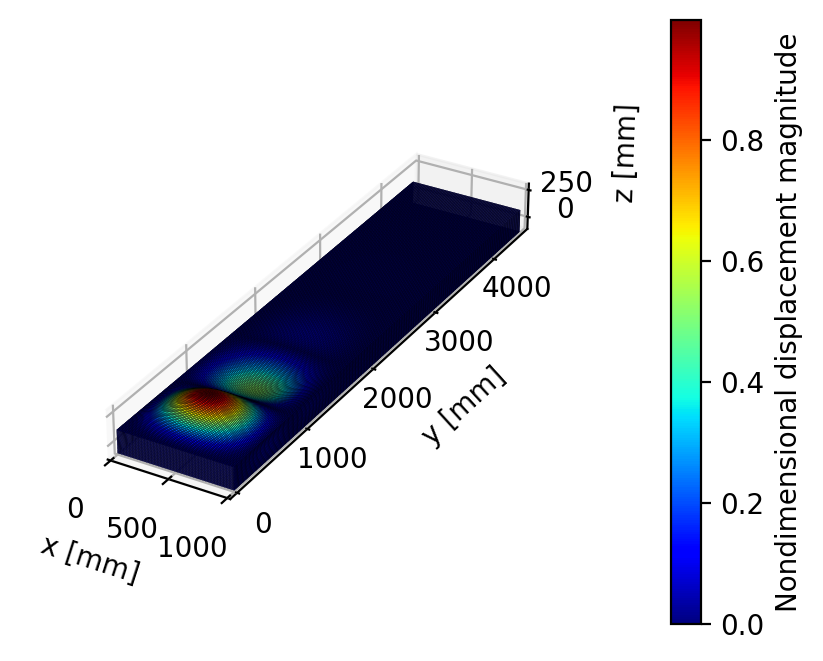

Buckling load: 3875 N


subcase=0 already exists...skipping



Results for model with 1001496 degrees of freedom and approximate shell element linear size of 8.0 mm


Buckling shape:


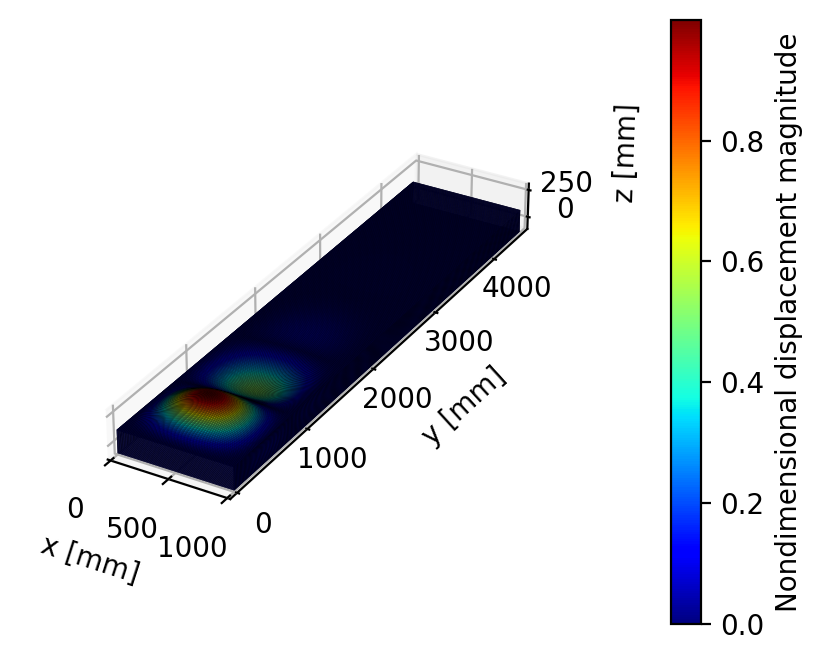

Buckling load: 3889 N


In [81]:
# Define sizes of the shell elements to be used for the mesh convergence study
shell_element_sizes = np.geomspace(h, t*2, 10) # [mm]
print('Approximate linear sizes of shell elements used for mesh convergence study [mm]:')
np.set_printoptions(precision=1)
print(shell_element_sizes)
# Initialize arrays with number of degrees of freedom and linear buckling load
dofs = np.empty(np.shape(shell_element_sizes))
linear_buckling_loads = np.ones(np.shape(shell_element_sizes))
# Iterate through the shell element lengths
for i, shell_size in enumerate(shell_element_sizes):
    # Generate bdf input
    box_beam_input, model_dofs = generate_fe_model(E, nu, rho, t, w, b, h, shell_size)[0:2]
    print(f'\n\033[1mResults for model with {model_dofs:.0f} degrees of freedom and approximate shell element linear size of {shell_size:.1f} mm\033[0m')
    # Store number of degrees of freedom
    dofs[i] = model_dofs
    # Calculate linear buckling load and plot shape
    linear_buckling_loads[i] = calculate_linear_buckling_load(box_beam_input, plot_shape=True)
    print(f'Buckling load: {linear_buckling_loads[i]:.0f} N')

Once the linear buckling analysis has been run for all mesh sizes, we can plot the results. On the same figure we plot the number of degrees of freedom versus the buckling loads and versus the percentage difference of each buckling load with respect to the one obtained with the coarser mesh.

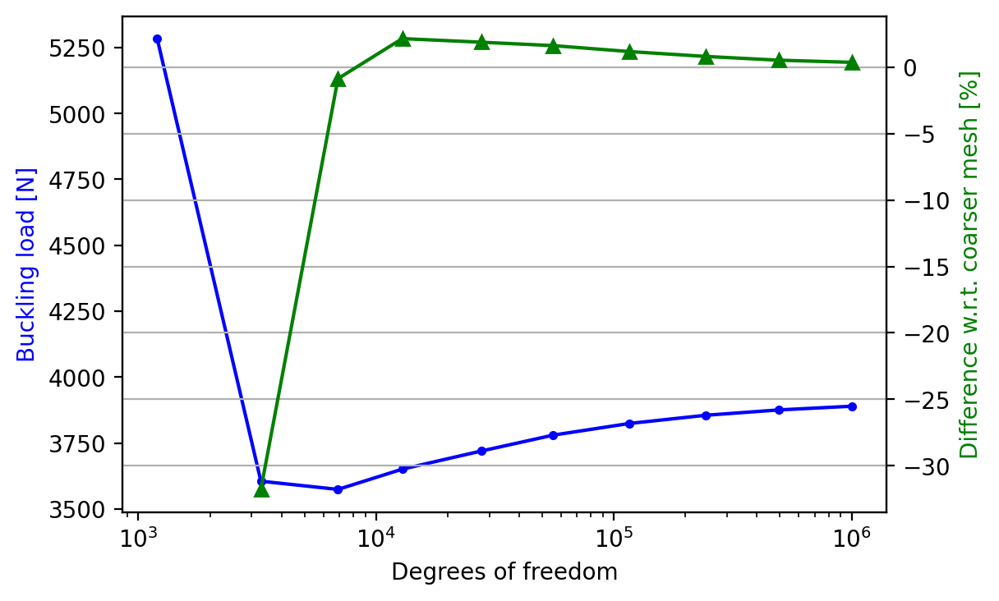

In [82]:
# Plot degrees of freedom vs buckling loads with a log scale along the x-axis
plt.semilogx(dofs, linear_buckling_loads, 'b.-')
# Add second y-axis on the right of the plot
ax1 = plt.gca()
ax2 = ax1.twinx()
# Calculate the percentage difference of each buckling load with respect to the one obtained with the coareser mesh
percentage_diff = (linear_buckling_loads[1:]/linear_buckling_loads[0:-1]-1)*100
# Plot degrees of freedom vs the percentage difference
ax2.plot(dofs[1:], percentage_diff, 'g^-')
# Set the axes label and the grid
ax1.set_xlabel('Degrees of freedom')
ax1.set_ylabel('Buckling load [N]', color='b')
ax2.set_ylabel('Difference w.r.t. coarser mesh [%]', color='g')
plt.grid()
plt.show()

We see that the buckling load makes a big jump between the largest two linear sizes of the shell elements and then assumes a monothonic behavior. The initial behavior can be probably ascribed to the poor resolution of the mesh that results in a stiffening of the structure. After such initial behavior, the buckling load appears to converge to a value between 3750 and 4000 N. We define the mesh to be converged when the percentage difference of the buckling loads falls below 1%.

In [83]:
converged_mesh_index = np.where(np.abs(percentage_diff)<1)[0][1]
print(f'The mesh is converged for an approximate shell element size of {shell_element_sizes[converged_mesh_index]:.1f}, corresponidng to {dofs[converged_mesh_index]:.0f} degrees of freedom and to a linear buckling load of {linear_buckling_loads[converged_mesh_index]:.0f} N.')

The mesh is converged for an approximate shell element size of 23.4, corresponidng to 116364 degrees of freedom and to a linear buckling load of 3824 N.


## Nonlinear buckling analyses <a name="nonlinear-buckling"></a>
Now we want to analyze the buckling behavior of our box beam with a nonlinear analysis. We can do this using solution sequence SOL 106, which calculates the nonlinear buckling load performing a linear eigenvalue analysis around a nonlinear state of the structure. The critical buckling load is calculated as it follows:
$$P_{cr}=P_n+\alpha\Delta P,$$
where $P_n$ is the applied load, $\alpha$ is the buckling factor calculated by SOL 106 and $\Delta P$ is the last load increment applied in the nonlinear analysis.

We first generate our base FE model for the nonlinear analysis using the shell element size reported earlier.

In [84]:
shell_element_size = shell_element_sizes[converged_mesh_index]
base_nonlinear_buckling_input, _, node_ids_array = generate_fe_model(E, nu, rho, t, w, b, h, shell_element_size)

subcase=0 already exists...skipping


We define a function that calculates the nonlinear buckling load running SOL 106, taking as input the `BDF` object and the magnitude of the applied load. The function performs the following steps in order.

- Assigns SOL 106 as solution sequence.
- Adds a NLPAM card for the definition of the following parameters for the nonlinear iteration strategy.
    * `ninc=100` to set the number of load increments
    * `kmethod='ITER'` and `kstep=1` to update the stiffness matrix at every iteration
    * `max_iter=25` to set the maximum number of iterations for each load increment
    * `conv='PV'` to select convergence criteria based on load equilibrium error with vector component method
    * `int_out='YES'` to process the output for every computed load increment
    * `eps_p=1e-3` to set the error tolerance for the load criteria
    * `max_bisect=10` to set the maximum number of bisections allowed for each load increment
- Adds a NLPCI card for the definition of the arc-length method parameters.
    * `Type='CRIS'` to set Crisfield constraint type.
    * `minalr=.01` and `maxalr=1.1` to set the minimum and maximum allowable arc-length adjustment ratio between increments, $MINALR \leq\frac{\Delta l_{new}}{\Delta l_{old}}\leq MAXALR$. Smaller values of $MAXALR$ were tested, but the analysis appeared to get stuck during subcase 4 around the bifurcation point.
    * `desiter=5` to set the desired number of iterations for convergence, which is used for the arc-length adjustment: $\Delta l_{new}=\Delta l_{old}\sqrt{DESITER/I_{max}}$ (where $I_{max}$ represents the number of iterations required for convergence in the previous load increment).
    * `mxinc=2000` to set the maximum number of controlled increment steps allowed within a subcase.
- Adds parameters to enable the buckling analysis and to take into account large displacement effects.
- Adds a LOAD card to define the load set and defines the first and only subcase.
- Adds a EIGRL card to define the parameters for the eigenvalue calculation.
- Writes the input file and runs the analysis.
- Reads the results and returns the buckling load.

The function also plots the deformed structure at the applied load and the first buckling shape if the input variable `plot_shape` is set to `True`.

In [85]:
import re

def calculate_nonlinear_buckling_load(bdf_input, load_magnitude, plot_shape=False):
    # Assign solution sequence, analysis title and model name
    bdf_input.sol = 106
    bdf_input.case_control_deck.subcases[0].add('TITLE', 'Nonlinear buckling analysis of a column', [], 'STRING-type')
    # Define general parameters for the nonlinear iteration strategy
    nlparm_id = 1
    bdf_input.add_nlparm(nlparm_id, ninc=100, kmethod='ITER', kstep=1, max_iter=25, conv='PV', int_out='YES', eps_p=1e-3, max_bisect=10)
    bdf_input.case_control_deck.subcases[0].add_integer_type('NLPARM', nlparm_id)
    # Define parameters for the arc-length method
    bdf_input.add_nlpci(nlparm_id, Type='CRIS', minalr=.01, maxalr=1.1, desiter=5, mxinc=2000)
    # Add parameters for buckling analysis and large displacement effects
    bdf_input.add_param('BUCKLE', [2])
    bdf_input.add_param('LGDISP', [1])
    # Define applied load and define first subcase
    load_sid = 10
    force_sid = [*bdf_input.loads][-1]
    bdf_input.add_load(load_sid, scale=1., scale_factors=[load_magnitude], load_ids=[force_sid])
    load_application_subcase_id = 1
    utils.create_static_load_subcase(bdf_input, subcase_id=load_application_subcase_id, subtitle='Application of uniform vertical load', load_sid=load_sid)
    # Define parameters for the linear eigenvalue calculation
    eigrl_sid = load_sid+1
    bdf_input.add_eigrl(eigrl_sid, 0., nd=1)
    bdf_input.case_control_deck.subcases[load_application_subcase_id].add_integer_type('METHOD', eigrl_sid)
    # Define name of analysis directory
    analysis_directory_name = 'NonlinearBuckling'
    analysis_directory_path = os.path.join(os.getcwd(), analysis_directory_name)
    # Run analysis
    model_name = 'box_beam_nonlinear_buckling'
    utils.run_analysis(analysis_directory_path, bdf_input, model_name, run_flag=True)
    # Read critical buckling factor
    f06_filename = os.path.join(analysis_directory_path, model_name + '.f06')
    regexp = re.compile('-? *[0-9]+\.?[0-9]*(?:[Ee] *[-+]? *[0-9]+)?')
    with open(f06_filename) as f06_file:
        for line in f06_file:
            if "ALPHA" in line:
                alpha = float(re.findall(regexp, line)[0])
                break
    # Read last load increment
    op2_filename = os.path.join(analysis_directory_path, model_name + '.op2')
    op2 = read_op2(op2_filename, debug=False)
    last_load_increment = load_magnitude*(1-list(op2.load_vectors.values())[1].lftsfqs[-2])
    # Plot buckling shape if requested
    if plot_shape:
        print(f'Nonlinear deformation:')
        plot_displacements(bdf_input, op2)
        print(f'Buckling shape:')
        plot_buckling_shape(bdf_input, op2)
    # Calculate buckling load and return value
    nonlinear_buckling_load = load_magnitude+last_load_increment*alpha
    return nonlinear_buckling_load

def plot_displacements(bdf_input, op2_output):
    # Create figure and axes
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')
    # Initialize list of displacement magnitude and vertices
    displacements = [None]*len(bdf_input.elements)
    vertices = [None]*len(bdf_input.elements)
    # Iterate through the elements of the BDF object
    for count, element in enumerate(bdf_input.elements.values()):
        # Store ids of the nodes as an array
        node_ids = np.array(element.node_ids)
        # Take the average displacement magnitude of each element
        displacements[count] = np.mean(np.apply_along_axis(np.linalg.norm, 1, [*op2_output.displacements.values()][1].data[-1, node_ids - 1, 0:3]))
        # Store the coordinates of the nodes of the deformed elements
        vertices[count] = np.vstack([bdf_input.nodes[index].xyz + [*op2_output.displacements.values()][0].data[0, index - 1, 0:3] for index in node_ids])
    # Create 3D polygons to represent the elements
    pc = Poly3DCollection(vertices, linewidths=.1)
    # Create colormap for the displacement magnitude and normalize values
    m = mpl.cm.ScalarMappable(cmap=mpl.cm.jet)
    m.set_array(displacements)
    m.set_clim(vmin=0, vmax=max(displacements))
    rgba_array = m.to_rgba(displacements)
    # Color the elements' face by the average displacement magnitude
    pc.set_facecolor([(rgb[0], rgb[1], rgb[2]) for rgb in rgba_array])
    # Set the edge color black
    pc.set_edgecolor('k')
    # Add polygons to the plot
    ax.add_collection3d(pc)
    # Set axes label
    ax.set_xlabel('x [mm]')
    ax.set_ylabel('y [mm]', labelpad=50)
    ax.set_zlabel('z [mm]', labelpad=10)
    # Set axes limmits
    x_coordinates = [func(points[:,0]) for points in vertices for func in (np.min, np.max)]
    y_coordinates = [func(points[:,1]) for points in vertices for func in (np.min, np.max)]
    z_coordinates = [func(points[:,2]) for points in vertices for func in (np.min, np.max)]
    ax.set_xlim(min(x_coordinates), max(x_coordinates))
    ax.set_ylim(min(y_coordinates), max(y_coordinates))
    ax.set_zlim(min(z_coordinates), max(z_coordinates))
    # Set aspect ratio of the axes
    ax.set_box_aspect([ub - lb for lb, ub in (getattr(ax, f'get_{a}lim')() for a in 'xyz')])
    # Adjust number of ticks and distance from axes
    plt.locator_params(axis='x', nbins=4)
    plt.locator_params(axis='z', nbins=2)
    ax.tick_params(axis='y', which='major', pad=15)
    ax.tick_params(axis='z', which='major', pad=5)
    # Add colorbar
    fig.colorbar(m, label='Displacement magnitude [mm]')
    # Show plot
    plt.show()

# nonlinear_buclking_load = calculate_nonlinear_buckling_load(base_nonlinear_buckling_input.__deepcopy__({}), 1., plot_shape=True)

For the nonlinear buckling analysis we want to investigate how the buckling load and shape change for different magnitudes of the applied load. We define 4 different applied loads, evenly spaced between 1 and 3800 N. For each applied load we calculate the nonlinear buckling load and we plot the nonlinear deformation of the structure and the predicted buckling shape.

Magnitude of applied loads for nonlinear buckling analyses [N]:
[1.0e+00 1.3e+03 2.5e+03 3.8e+03]

Results for model with an applied load of 1 N


Nonlinear deformation:


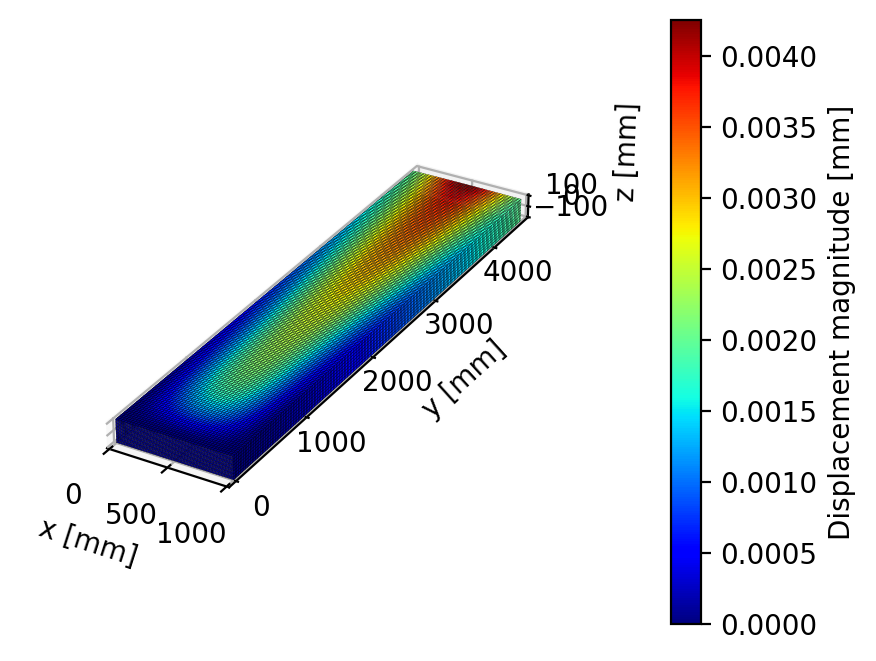

Buckling shape:


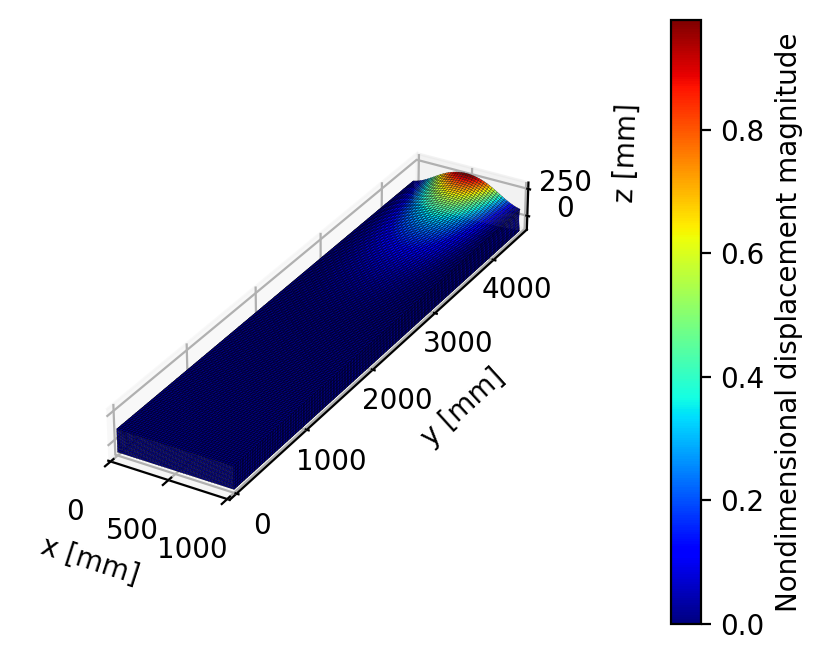

Buckling load: 1228 N

Results for model with an applied load of 1267 N


Nonlinear deformation:


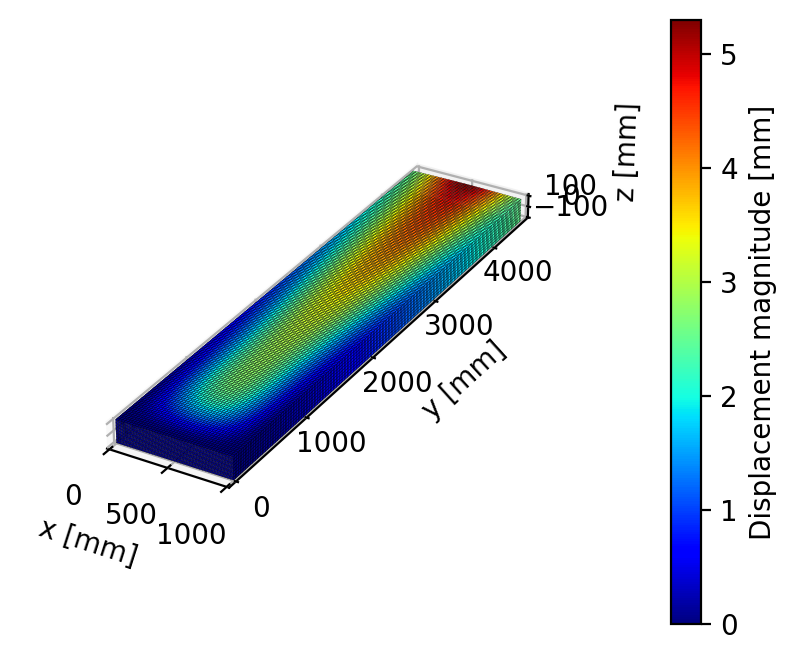

Buckling shape:


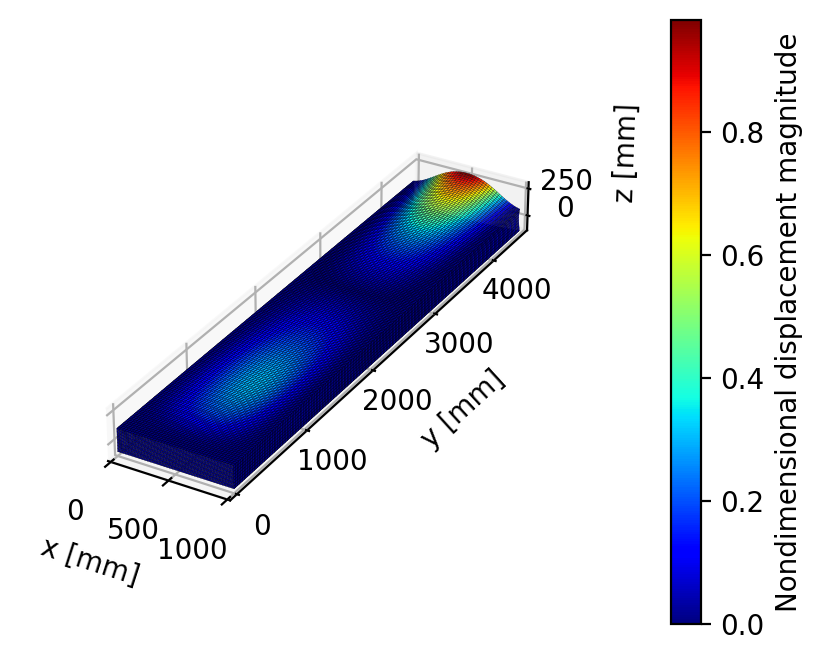

Buckling load: 2594 N

Results for model with an applied load of 2534 N


Nonlinear deformation:


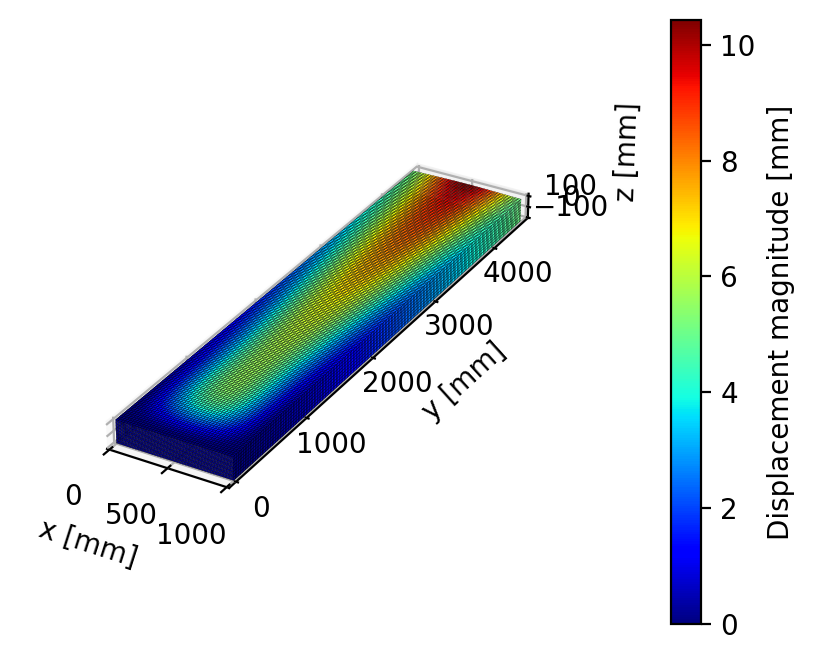

Buckling shape:


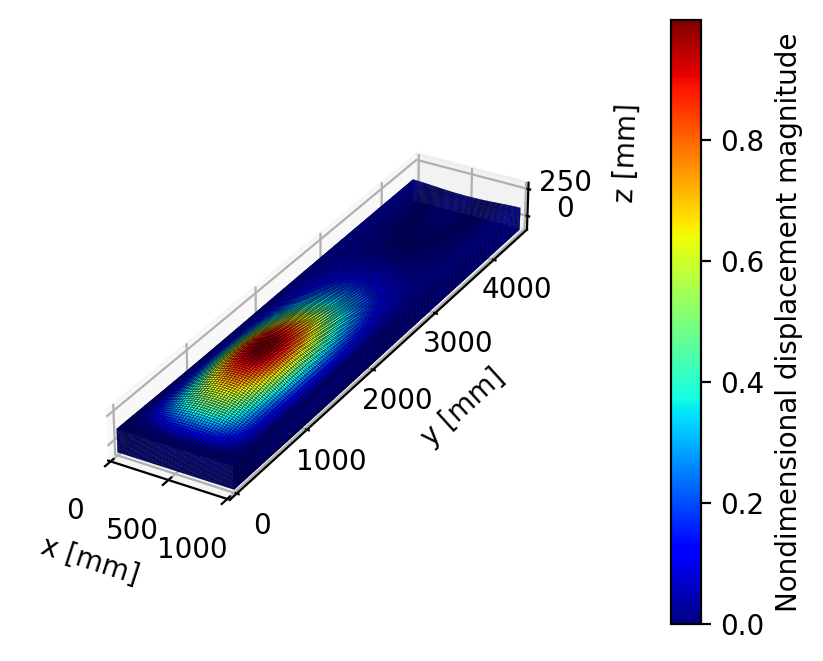

Buckling load: 3871 N

Results for model with an applied load of 3800 N


Nonlinear deformation:


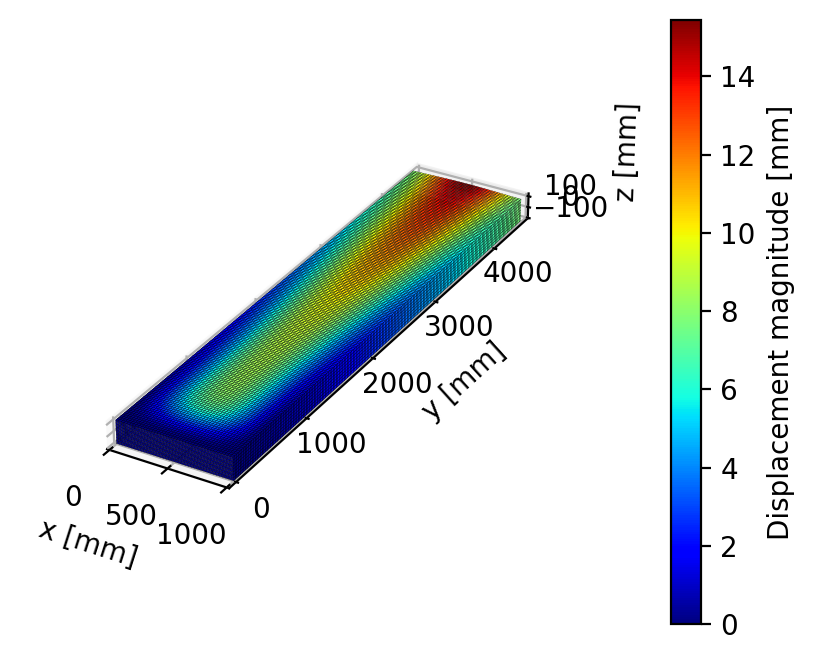

Buckling shape:


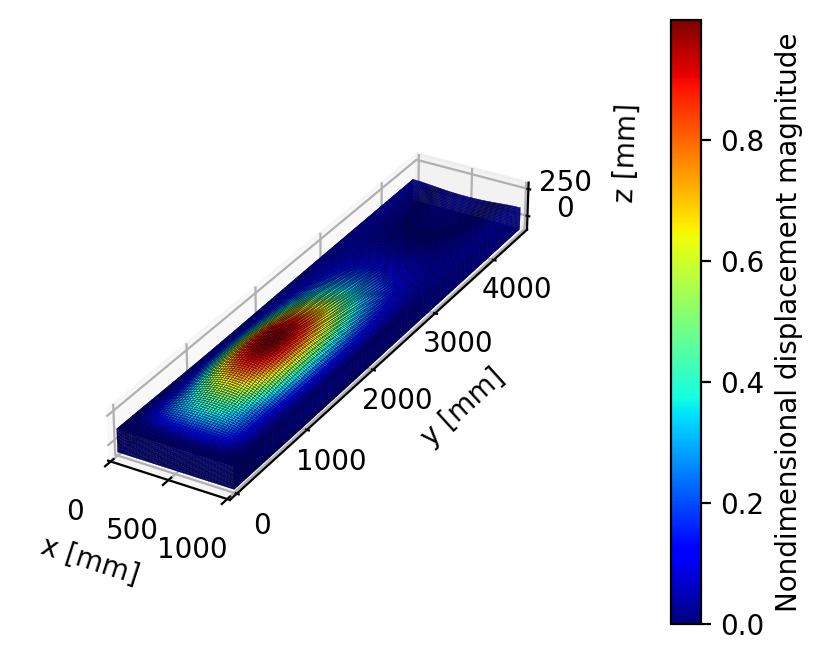

Buckling load: 5151 N


In [86]:
# Define load magnitudes to be used for the nonlinear analyses
applied_loads = np.linspace(1, np.floor(linear_buckling_loads[converged_mesh_index] / 100.0) * 100, 4) # [mm]
print('Magnitude of applied loads for nonlinear buckling analyses [N]:')
np.set_printoptions(precision=1)
print(applied_loads)
# Initialize array with nonlinear buckling loads
nonlinear_buckling_loads = np.empty(np.shape(applied_loads))
# Iterate through the applied loads
for i, applied_load in enumerate(applied_loads):
    # Calculate nonlinear buckling load and plot shape
    print(f'\n\033[1mResults for model with an applied load of {applied_load:.0f} N\033[0m')
    nonlinear_buckling_loads[i] = calculate_nonlinear_buckling_load(base_nonlinear_buckling_input.__deepcopy__({}), applied_load, plot_shape=True)
    print(f'Buckling load: {nonlinear_buckling_loads[i]:.0f} N')

We also plot the nonlinear buckling loads against the applied loads, comparing those with the linear buckling load.

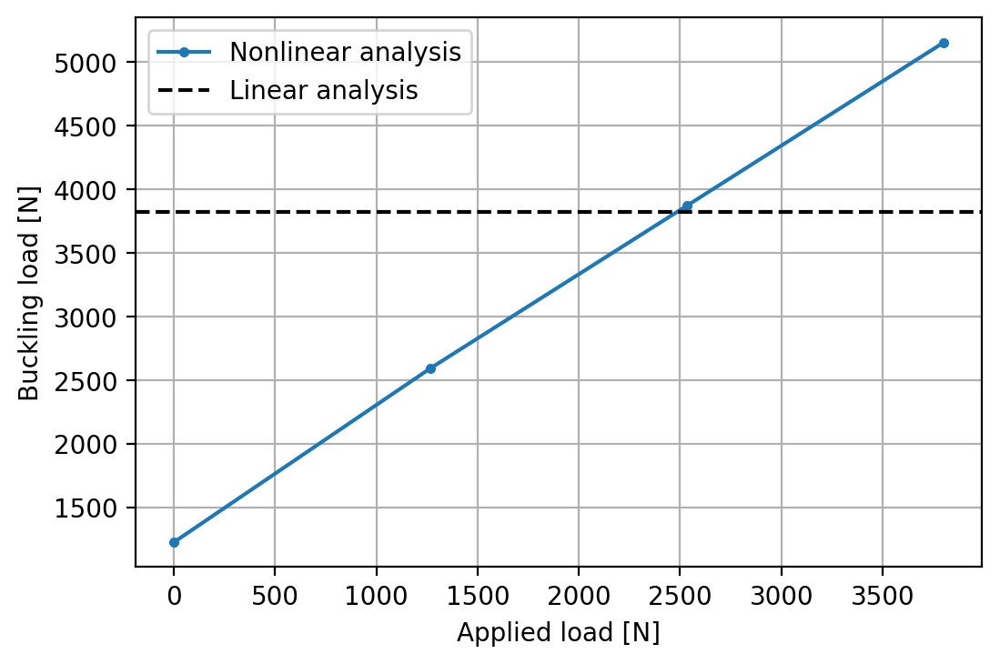

In [87]:
def plot_buckling_loads(p, pcr_nonlinear, pcr_linear):
    # Create new figure
    fig, ax = plt.subplots()
    # Plot nonlinear buckling load vs applied load
    nonlinear_buckling_line, = ax.plot(p, pcr_nonlinear, '.-', label='Nonlinear analysis')
    # Plot linear buckling load as a reference
    xlim = ax.get_xlim()
    linear_buckling_line, = ax.plot(list(xlim), [pcr_linear]*2, 'k--', label='Linear analysis')
    # Set labels x-axis limits and grid
    plt.xlabel('Applied load [N]')
    plt.ylabel('Buckling load [N]')
    plt.xlim(xlim)
    plt.grid()
    # Set legend and show plot
    ax.legend(handles=[nonlinear_buckling_line, linear_buckling_line])
    plt.show()

plot_buckling_loads(applied_loads, nonlinear_buckling_loads, linear_buckling_loads[converged_mesh_index])

Some observation can be made looking at the results.
- The displacement field obtained from the nonlinear analysis is analogous for all applied loads and presents a peak of the displacement magnitude at the tip of the top skin. Since there is no rib to reinforce the sections of the box beam, the skin results relatively flexible and gets pulled out-of-plane by the distributed load. This behavior is evidently different from a classic global beam-like deformation where the sections of the beam stay substantially undeformed. The magnitude of the displacement peak suggests a linear behavior of the structure for the range of applied loads investigated.
- Despite the analogous displacement fields, the first buckling shape appears to change with the magnitude of the applied load. For smaller load magnitudes the first buckling shape affects the tip of the box beam, while for larger load magnitudes the displacement peak is located more inboard, resembling sligthly more the shape predicted by the linear buckling analysis. As a consequence, it appears that for small loads the buckling shape is more influenced by the local displacement of the top skin at the tip of the box beam, while for large loads the buckling shape is less influenced by that and resembles more the shape that would be expected for a structure having a global beam-like behavior.
- The buckling load predicted by the nonlinear analyses appears to have a linear relationship with the applied load and does not seem to converge to a certain value. Furthermore, the nonlinear buckling load for an applied load of 1 N is considerably smaller than the linear buckling load. Since the structure is deformed only slightly, it is very close to its undeformed state and it would be reasonable to expect a similar buckling behavior to the one predicted by the linear analysis, which accounts only for the undeformed state of the structure. It is unclear why this happens, so further investigation is needed. It is possible that the nonlinear deformation acts like an imperfection that breaks the bifurcation point corresponding to the critical buckling load. If this is the case, it is necessary to understand what the eigenvalues calculated by SOL 106 represent.

### Box beam with rigid tip section <a name="distributed-load-rigid-tip"></a>
Let's try now to limit the out-of-plane displacement of the top skin observed at the tip for the previous nonlinear analyses. We are going to constrain the tip section of the box beam in order to make it rigid, keeping the same type of distributed load employed earlier.

We define a new base `BDF` object and we add a master node at the center of the tip section. We then add a RBE2 element that constrains all the nodes along the section of the tip to the master node, making the section rigid.

In [88]:
# Generate a base bdf input
rigid_tip_section_input = generate_fe_model(E, nu, rho, t, w, b, h, shell_element_size)[0]
# Add master node of tip section
master_node_id = np.amax(node_ids_array)+1
rigid_tip_section_input.add_grid(master_node_id, [w/2, b/2, 0.])
# Add RBE2 element to make tip section rigid
tip_nodes_ids = list(node_ids_array[-1,0:-2])
rbe2_eid = len(rigid_tip_section_input.elements)+1
rigid_tip_section_input.add_rbe2(rbe2_eid, master_node_id, '123456', tip_nodes_ids)

subcase=0 already exists...skipping


RBE2       19201   19301  123456     193     386     579     772     965
            1158    1351    1544    1737    1930    2123    2316    2509
            2702    2895    3088    3281    3474    3667    3860    4053
            4246    4439    4632    4825    5018    5211    5404    5597
            5790    5983    6176    6369    6562    6755    6948    7141
            7334    7527    7720    7913    8106    8299    8492    8685
            8878    9071    9264    9457    9650    9843   10036   10229
           10422   10615   10808   11001   11194   11387   11580   11773
           11966   12159   12352   12545   12738   12931   13124   13317
           13510   13703   13896   14089   14282   14475   14668   14861
           15054   15247   15440   15633   15826   16019   16212   16405
           16598   16791   16984   17177   17370   17563   17756   17949
           18142   18335   18528   18721   18914   19107

We run a linear buckling analysis to check for any change in the buckling load and shape with respect to the configuration with a free tip section.

Buckling shape:


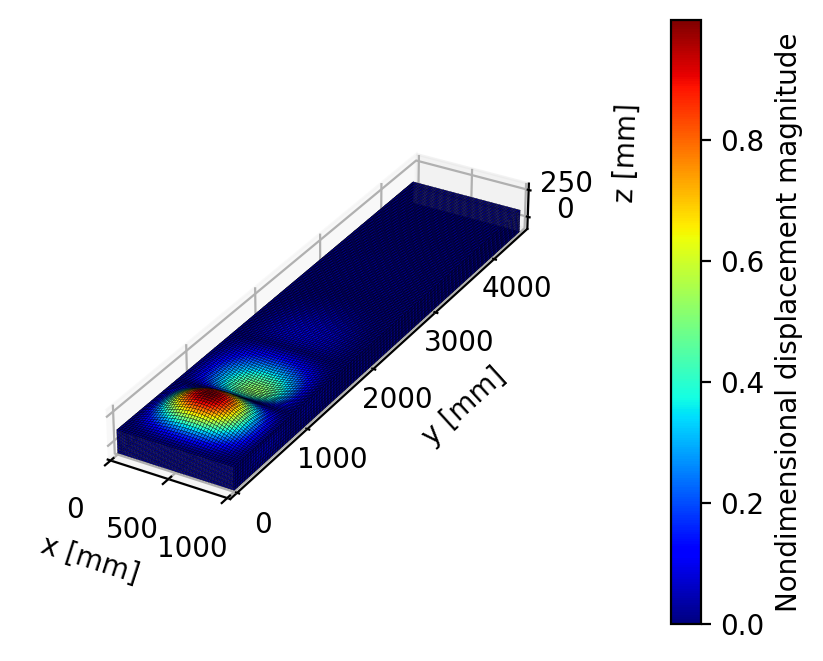

Buckling load: 3824 N


In [89]:
# Calculate linear buckling load and plot shape
linear_buckling_load = calculate_linear_buckling_load(rigid_tip_section_input.__deepcopy__({}), plot_shape=True)
print(f'Buckling load: {linear_buckling_load:.0f} N')

We can observe how both the buckling load and the buckling shape do not change with respect to the free tip configuration. The reason for this has to be found in the fact that the linear buckling analysis considers the structure in its undeformed state only and as a consequence it is not able to catch any difference between a free and a rigid tip section.

Now we switch to the nonlinear buckling analysis and we apply the same loads that we used for the free tip configuration.


Results for model with an applied load of 1 N


Nonlinear deformation:


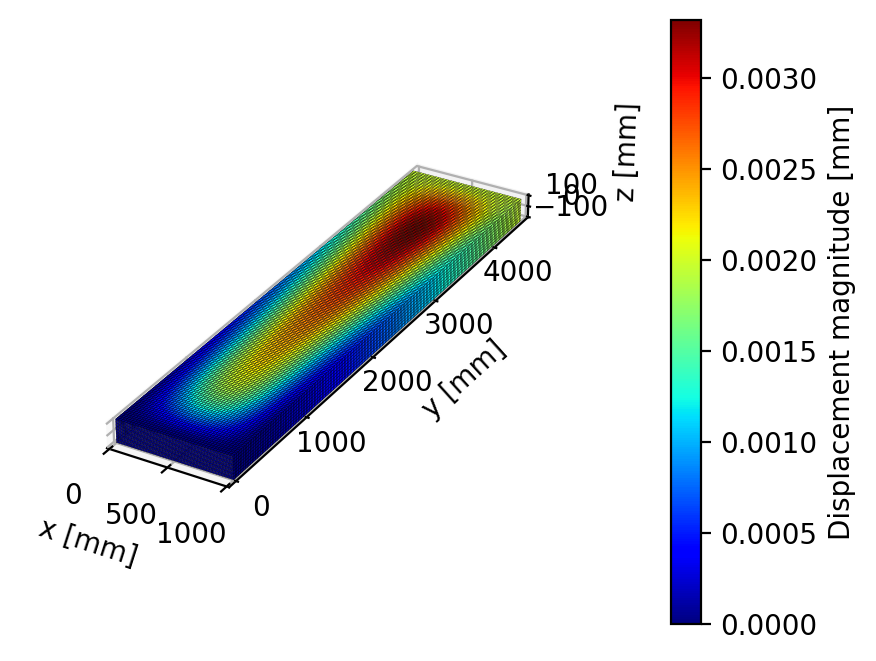

Buckling shape:


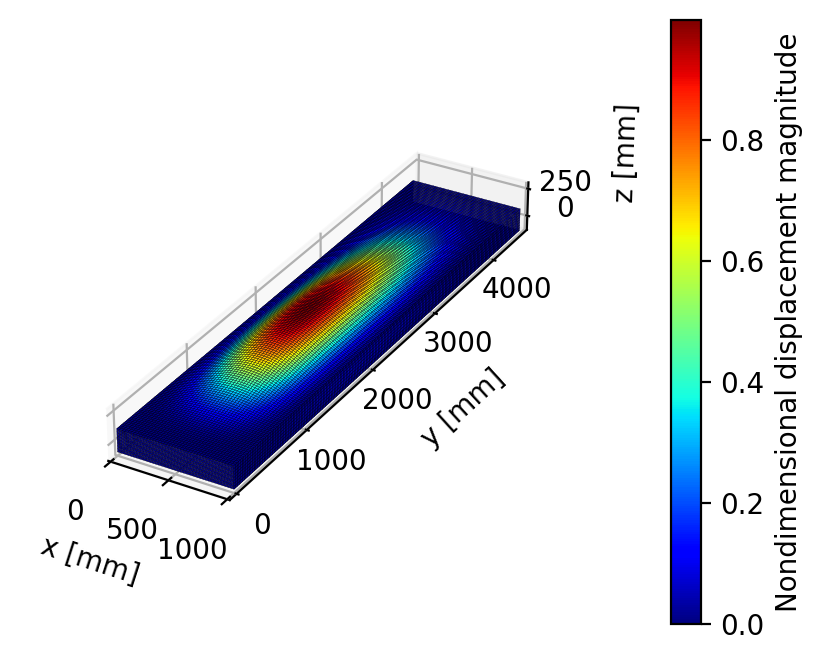

Buckling load: 1340 N

Results for model with an applied load of 1267 N


Nonlinear deformation:


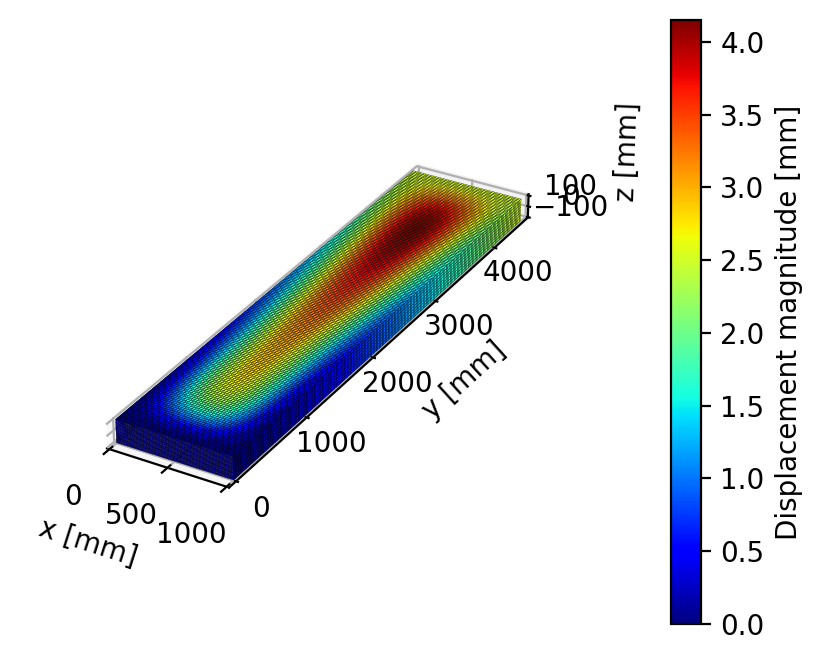

Buckling shape:


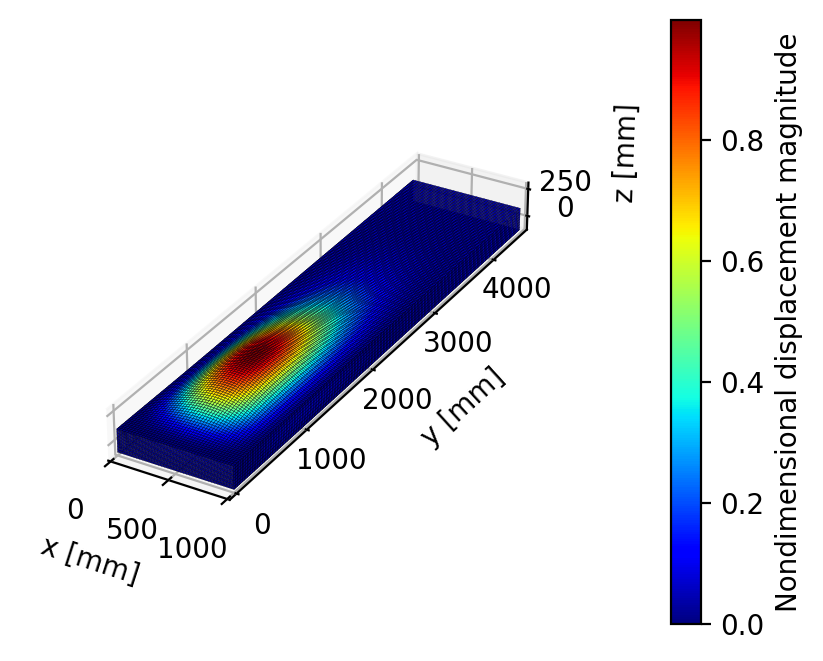

Buckling load: 2593 N

Results for model with an applied load of 2534 N


Nonlinear deformation:


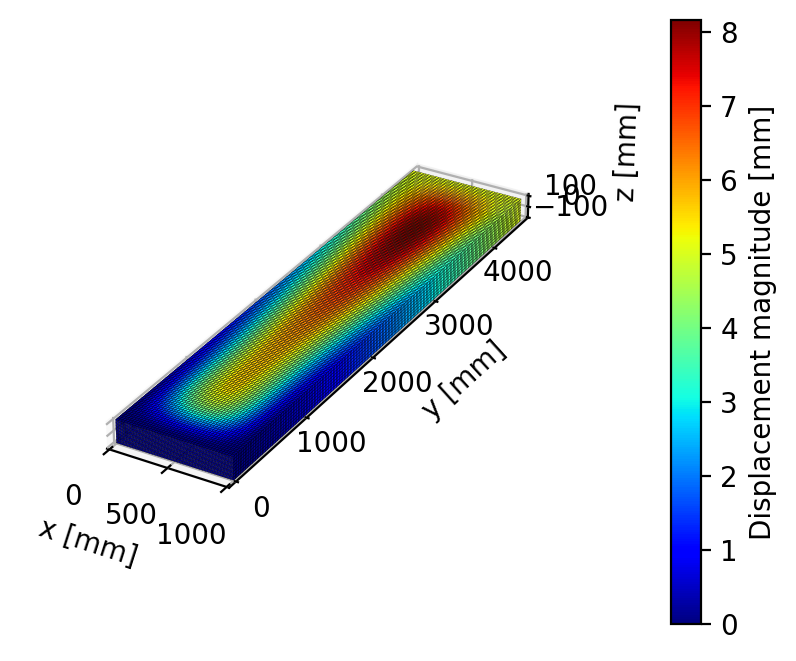

Buckling shape:


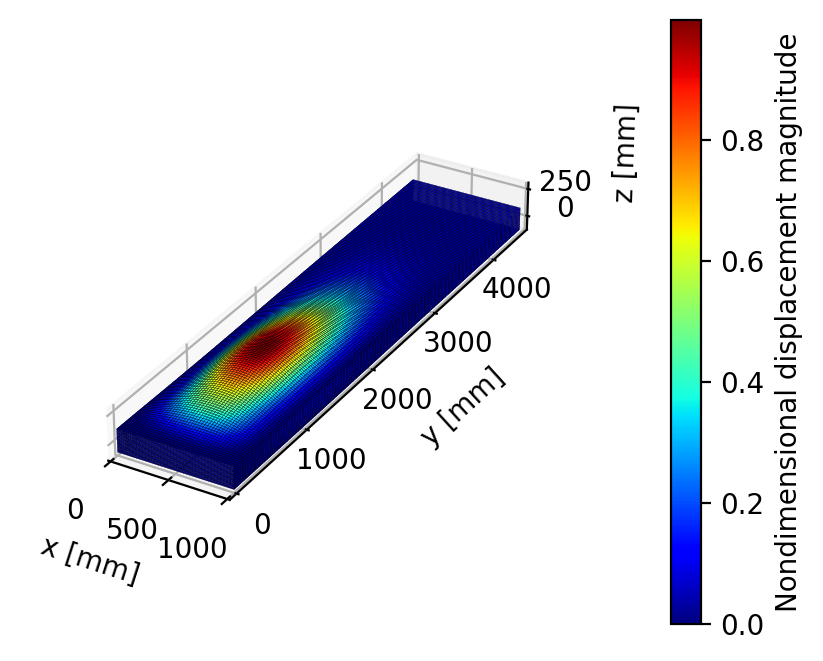

Buckling load: 3860 N

Results for model with an applied load of 3800 N


Nonlinear deformation:


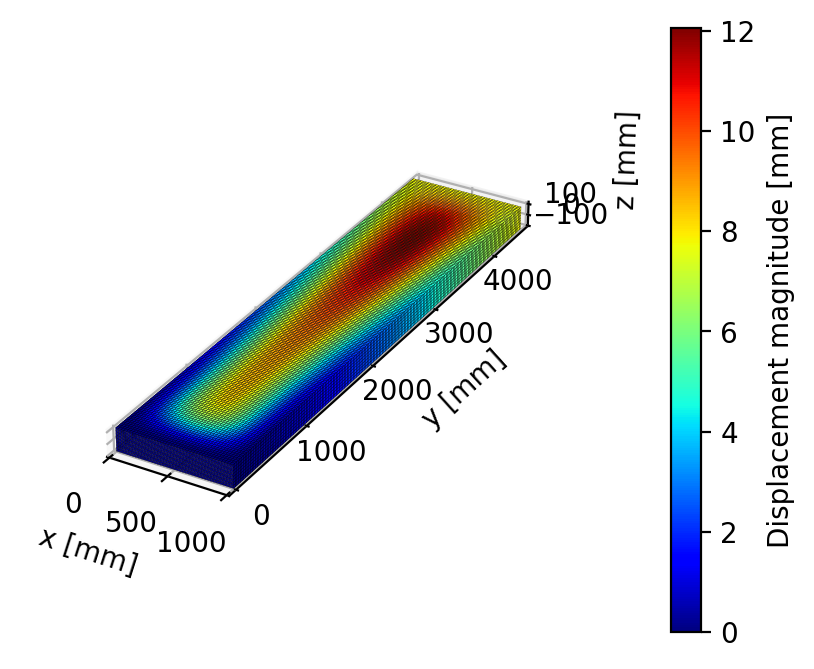

Buckling shape:


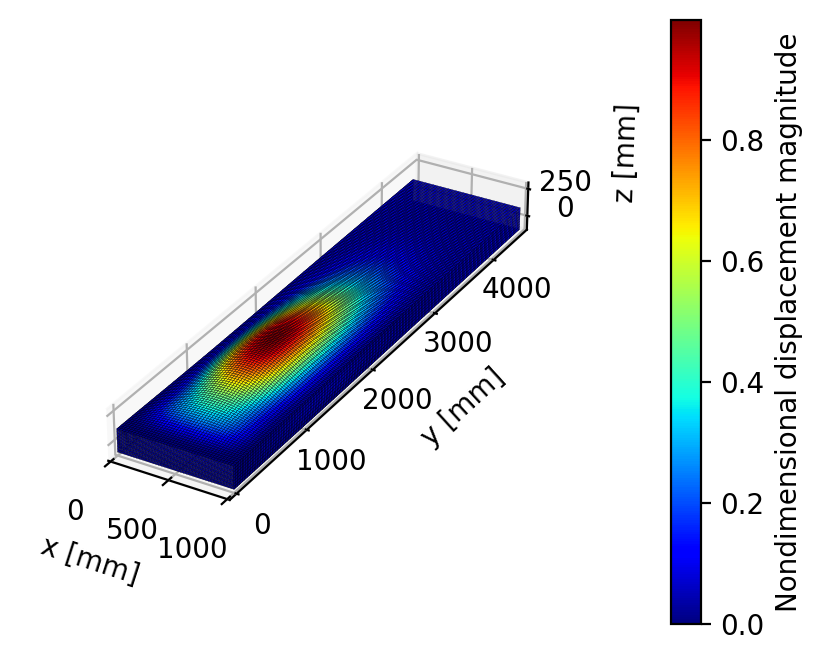

Buckling load: 5125 N


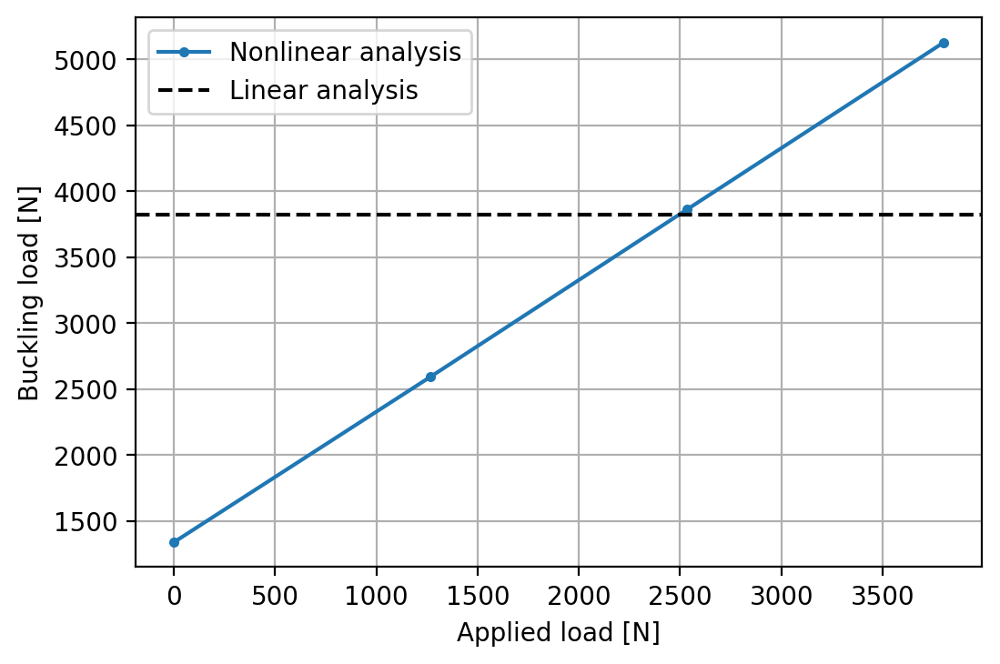

In [90]:
# Initialize array with nonlinear buckling loads
nonlinear_buckling_loads = np.empty(np.shape(applied_loads))
# Iterate through the applied loads
for i, applied_load in enumerate(applied_loads):
    # Calculate nonlinear buckling load and plot shape
    print(f'\n\033[1mResults for model with an applied load of {applied_load:.0f} N\033[0m')
    nonlinear_buckling_loads[i] = calculate_nonlinear_buckling_load(rigid_tip_section_input.__deepcopy__({}), applied_load, plot_shape=True)
    print(f'Buckling load: {nonlinear_buckling_loads[i]:.0f} N')
# Plot nonlinear buckling loads vs applied loads
plot_buckling_loads(applied_loads, nonlinear_buckling_loads, linear_buckling_load)

Looking at the nonlinear deformation plots, we can observe that with the rigid tip section, the displacement pick has moved sligthly more inboard with respect to what we found for the free tip configuration. In fact, if on one hand the rigid tip section eliminates the out-of-plane displacement of the top skin at the very tip of the box beam, we can still observe such behavior almost all over the span. Clearly, more rigid sections or the introduction of some ribs are needed to obtain a displacement field resembling a global beam-like kind of deformation.

Nevertheless, the presence of the rigid tip section seems to have a substantial effect on the buckling shape. In fact, there is no local buckling mode at the tip for small loads, in contrast to what was found for the free section configuration. The displacement peak is located approximately at the center of the box beam along the span for an applied load of 1 N, while it moves more towards the root for larger loads. The buckling shape for large loads is similar to the one obtained with the free tip configuration. As a consequence it can be stated that the rigid tip section has a substantial influence only on the buckling behavior only for small applied loads.

As far as the magnitude of the buckling loads is concerned, analogous results with respect to the free tip configuration are found also here.

### Box beam loaded with concentrated tip load <a name="concentrated-load"></a>
Now we are going to change the type of load applied on our box beam. Instead of a distributed load over the top skin, we are going to load the structure with a concentrated force applied at the center of the tip section. We are going to investigate the response to this load with both a free and a rigid tip section.

#### Free tip section <a name="free-tip"></a>
Let's start with applying the concetrated load to a box beam with a free tip section. Similarly to the previous case with a rigid section, we create a base `BDF` object and we add a master node at the center of the tip section. This time we add a RBE3 element to connect the nodes of the section to the master node. This element allows us to introduce a force at the master node and to distribute it to the nodes of the tip section, where the motion of the master node is defined as a weighted average of the motions of the connected nodes. Finally, we add a concentrated upward force of 1 N at the master node using a FORCE card.

In [91]:
# Generate a base bdf input
concentrated_load_free_tip_section_input = generate_fe_model(E, nu, rho, t, w, b, h, shell_element_size)[0]
# Add master node of tip section
master_node_id = np.amax(node_ids_array)+1
concentrated_load_free_tip_section_input.add_grid(master_node_id, [w/2, b/2, 0.])
# Add RBE3 element to apply concentrated load at the master node
rbe3_eid = rbe2_eid
concentrated_load_free_tip_section_input.add_rbe3(eid=rbe3_eid, refgrid=master_node_id, refc='123456', weights=[1.]*len(tip_nodes_ids), comps=['123456']*len(tip_nodes_ids), Gijs=tip_nodes_ids)
# Add concentrated force
concentrated_force_sid = 3
concentrated_force_magnitude = 1.
concentrated_force_direction = [0., 0., 1.]
concentrated_load_free_tip_section_input.add_force(sid=concentrated_force_sid, node=master_node_id, mag=concentrated_force_magnitude, xyz=concentrated_force_direction)

subcase=0 already exists...skipping


FORCE          3   19301              1.      0.      0.      1.

Once again we first calculate the linear buckling load and the corresponding shape.

Buckling shape:


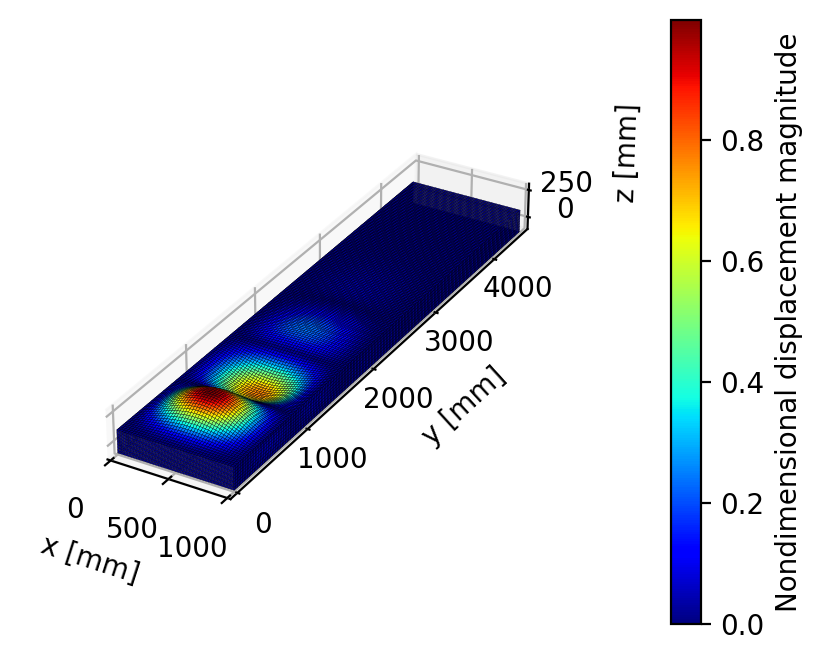

Buckling load: 1657 N


In [92]:
# Calculate linear buckling load and plot shape
linear_buckling_load = calculate_linear_buckling_load(concentrated_load_free_tip_section_input.__deepcopy__({}), plot_shape=True)
print(f'Buckling load: {linear_buckling_load:.0f} N')

The predicted buckling shape is similar to the one of the case with a distributed load. The buckling load results smaller, as expected. In fact, since the force is only applied at the tip of the box beam, the effective moment arm with respect to the root is larger than the one of the distributed load case. As a consequence, a smaller force is needed to induce buckling in the structure.

Once again we run our nonlinear analyses applying 4 different load magnitudes, this time evenly distributed between 1 N and 1600 N.


Results for model with an applied load of 1 N


Nonlinear deformation:


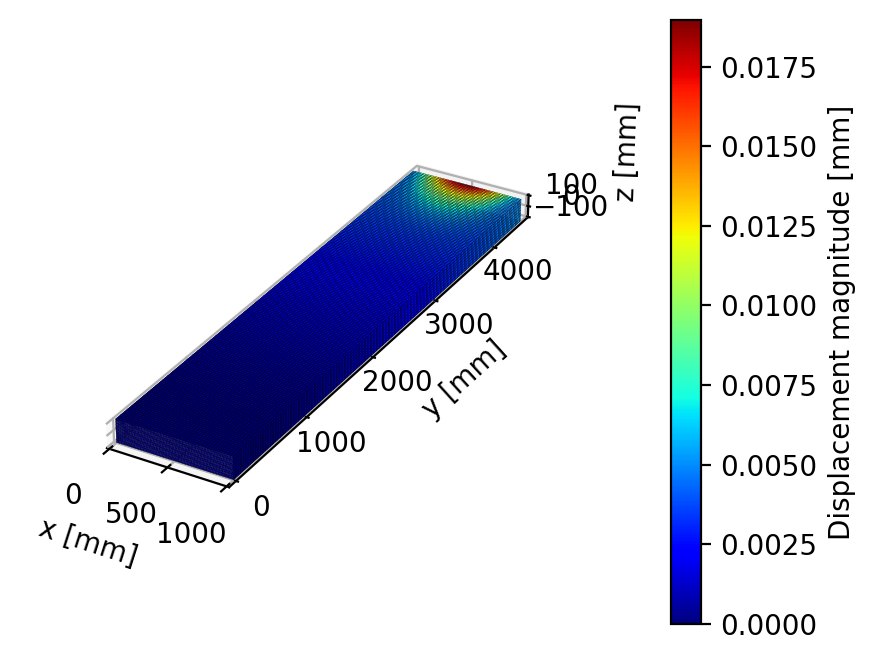

Buckling shape:


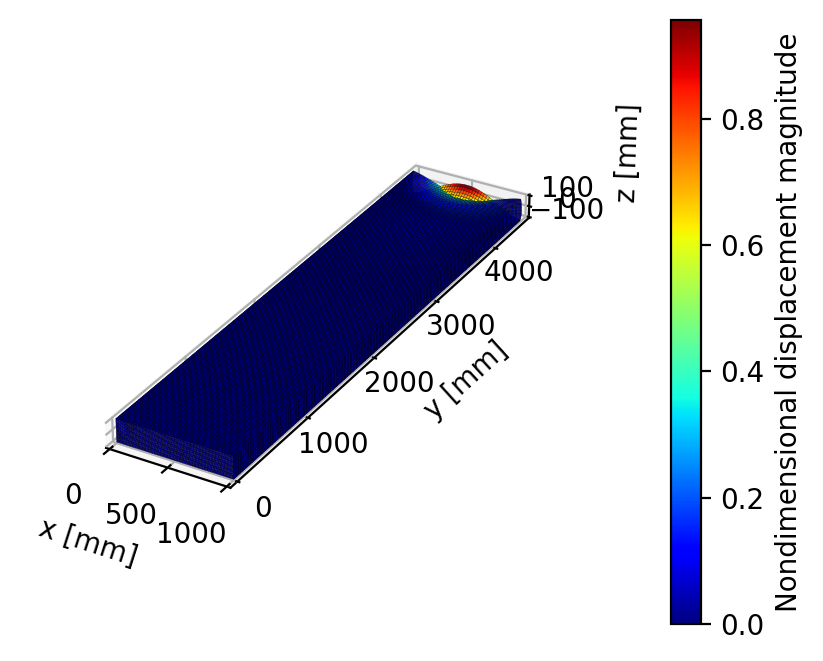

Buckling load: 156 N

Results for model with an applied load of 534 N


Nonlinear deformation:


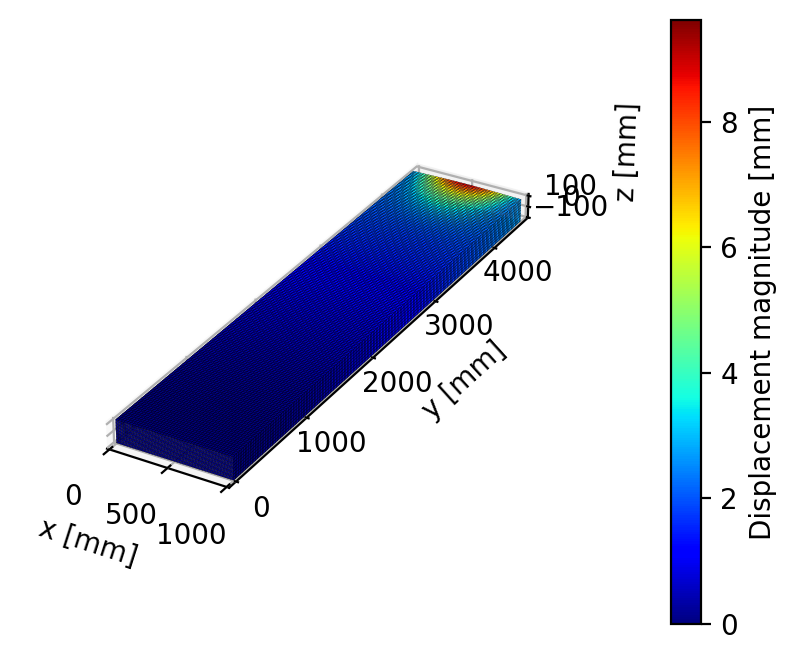

Buckling shape:


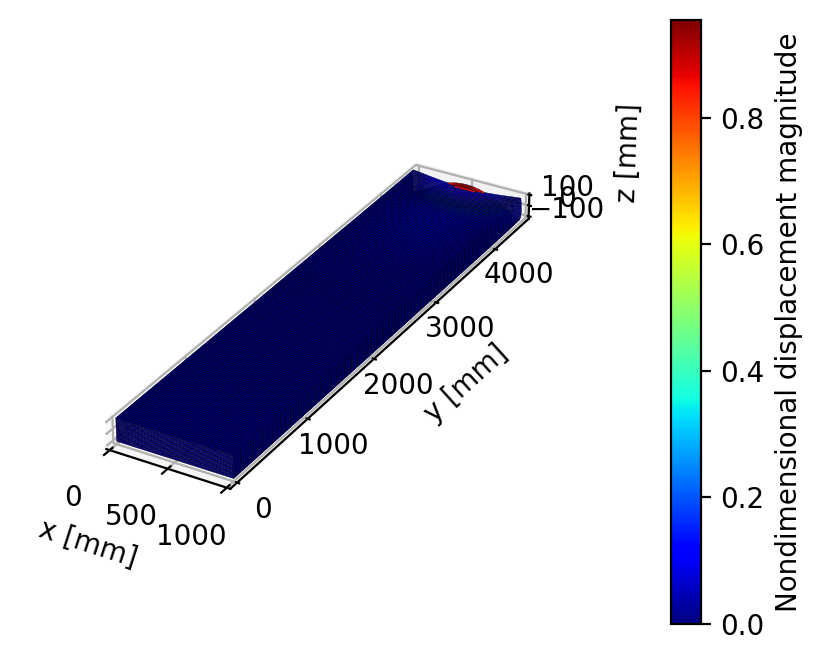

Buckling load: 783 N

Results for model with an applied load of 1067 N


Nonlinear deformation:


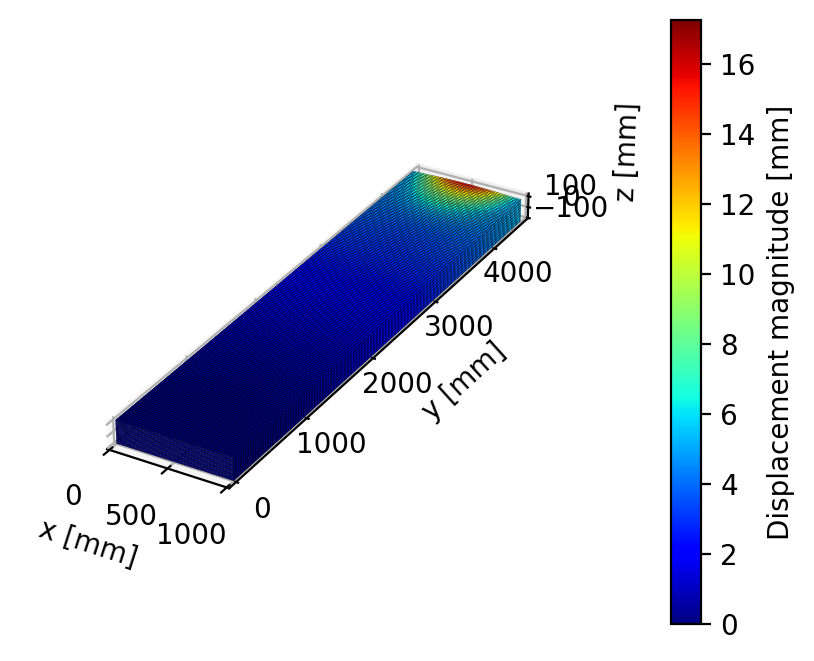

Buckling shape:


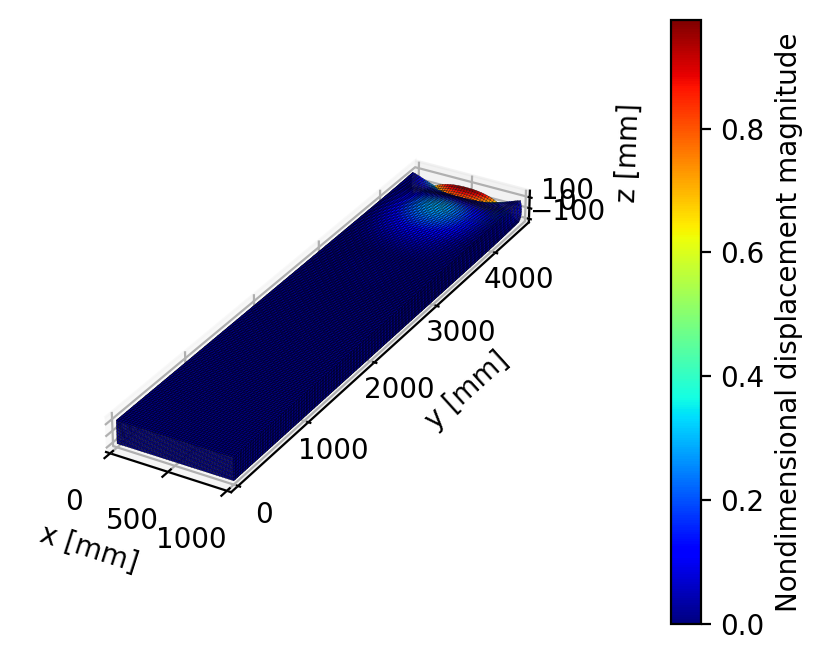

Buckling load: 1508 N

Results for model with an applied load of 1600 N


Nonlinear deformation:


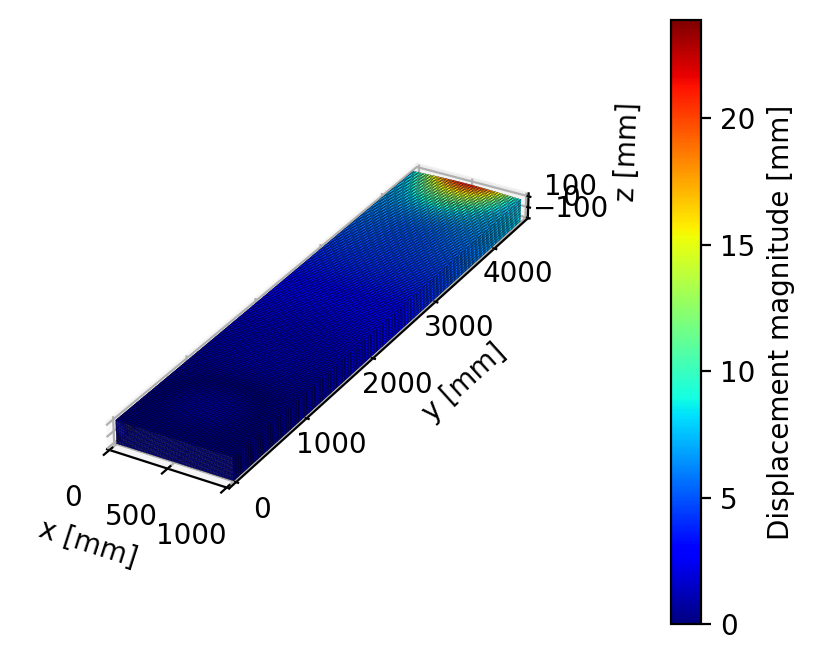

Buckling shape:


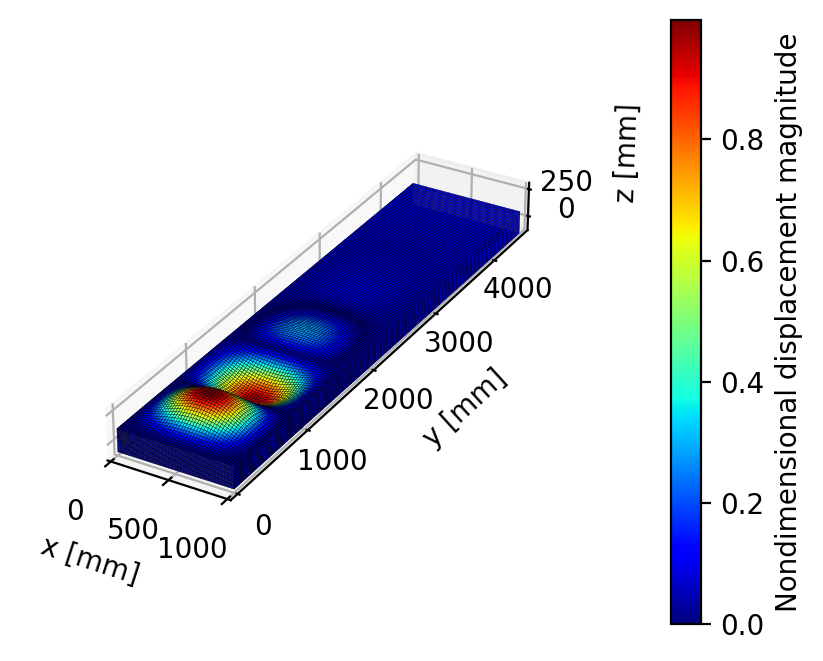

Buckling load: 1688 N


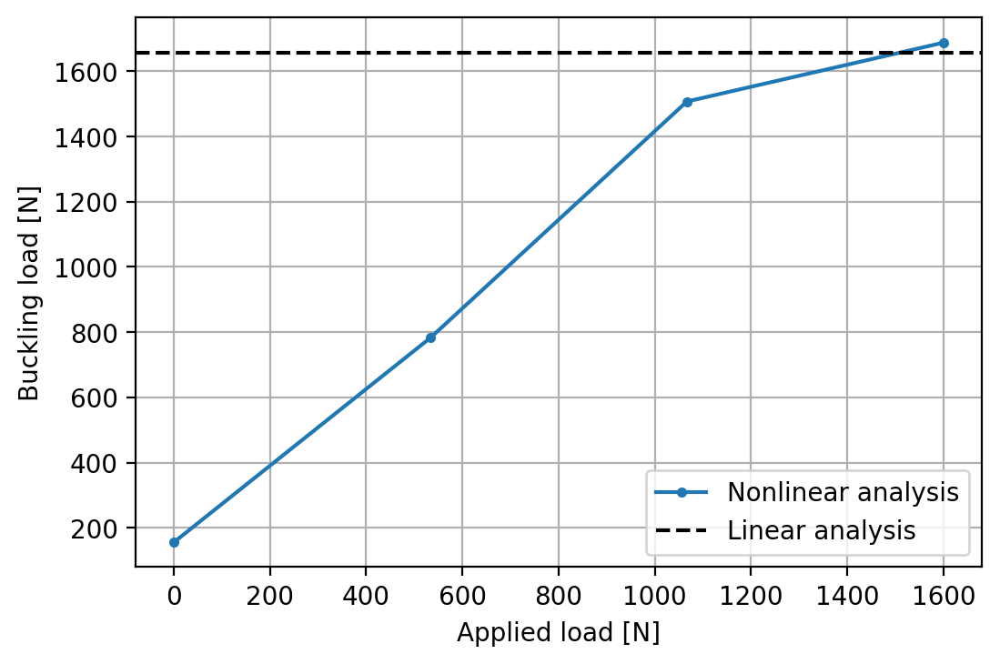

In [93]:
# Define load magnitudes to be used for the nonlinear analysis
applied_loads = np.linspace(1, np.floor(linear_buckling_load / 100.0) * 100, 4) # [mm]
# Initialize array with nonlinear buckling loads
nonlinear_buckling_loads = np.empty(np.shape(applied_loads))
# Iterate through the applied loads
for i, applied_load in enumerate(applied_loads):
    # Calculate nonlinear buckling load and plot shape
    print(f'\n\033[1mResults for model with an applied load of {applied_load:.0f} N\033[0m')
    nonlinear_buckling_loads[i] = calculate_nonlinear_buckling_load(concentrated_load_free_tip_section_input.__deepcopy__({}), applied_load, plot_shape=True)
    print(f'Buckling load: {nonlinear_buckling_loads[i]:.0f} N')
# Plot nonlinear buckling loads vs applied loads
plot_buckling_loads(applied_loads, nonlinear_buckling_loads, linear_buckling_load)

Also for this investigation, the displacement field obtained from the nonlinear static analyses is analogous for all load magnitudes. However, the displacement does not appear to be distributed all along the span of the box beam, rather it is concentrated in the region of the tip. As expected, the displacement peak is located at the center of the skin, given the flexibility caused by the free section. A small nonlinearity can be noted looking at the change of the magnitude of the displacement peak with the different applied loads.

The effect of the locally-dominated nonlinear displacement field can be clearly seen on the buckling shape. In fact, the buckling deformation is extremely localized at the tip of the box beam. Only for the case with the largest load magnitude, the buckling shape is very similar to the one predicted by the linear analysis, so closer to a structure having a global beam-like behavior. This seems to confirm the fact that the local deformation at the tip of the box beam has a different influence on the buckling behavior according to the level of applied load.

Once again we notice that the nonlinear analysis predicts buckling loads linearly dependent from the applied loads, except for the largest applied load, where the linearity seems to break. However, the predicted buckling loads do not show a clear convergence towards a certain value. Furthermore, the buckling load obtained with an applied load of 1 N is again the farthest value from the linear buckling load, which is not what is expected.

#### Rigid tip section  <a name="rigid-tip"></a>
Finally, we want to test the concentrated load with a rigid tip section. Analogously to the previous cases, we generate a base `BDF` object, add a master node at the center of the tip section, add an RBE2 element to constrain the section and add a concentrated load at the master node with a FORCE card. We then calculate the linear buckling load with the associated shape.

subcase=0 already exists...skipping


Buckling shape:


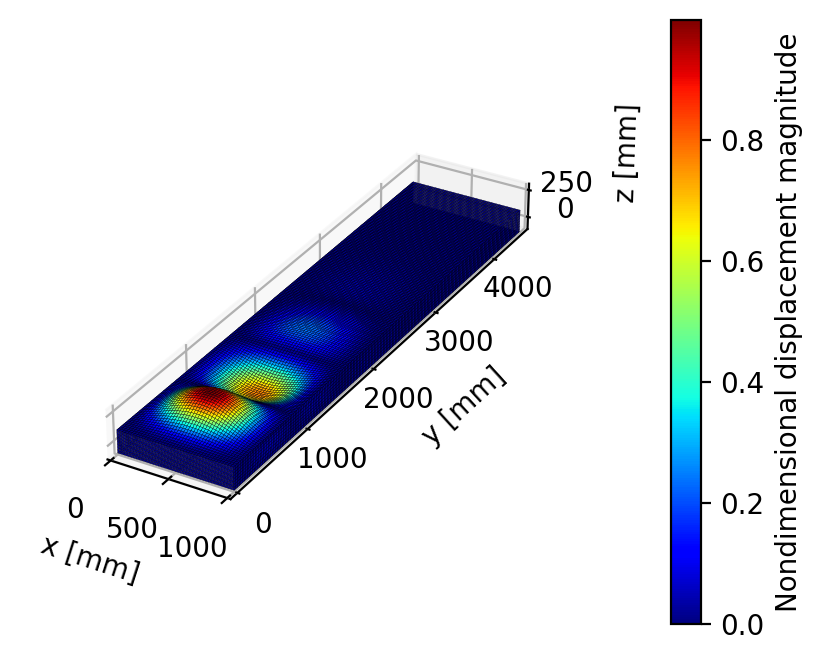

Buckling load: 1657 N


In [94]:
# Generate a base bdf input
concentrated_load_rigid_tip_section_input = generate_fe_model(E, nu, rho, t, w, b, h, shell_element_size)[0]
# Add master node of tip section
concentrated_load_rigid_tip_section_input.add_grid(master_node_id, [w/2, b/2, 0.])
# Add RBE2 element to make tip section rigid
concentrated_load_rigid_tip_section_input.add_rbe2(rbe2_eid, master_node_id, '123456', tip_nodes_ids)
# Add concentrated force to rigid tip section input
concentrated_load_rigid_tip_section_input.add_force(sid=concentrated_force_sid, node=master_node_id, mag=concentrated_force_magnitude, xyz=concentrated_force_direction)
# Calculate linear buckling load and plot shape
linear_buckling_load = calculate_linear_buckling_load(concentrated_load_rigid_tip_section_input.__deepcopy__({}), plot_shape=True)
print(f'Buckling load: {linear_buckling_load:.0f} N')

Also in this case we do not notice any difference in terms of buckling load and shape with respect to the free tip configuration, as expected.

We now run our nonlinear analyses in an analogous way as for the previous case.


 Results for model with an applied load of 1 N


Nonlinear deformation:


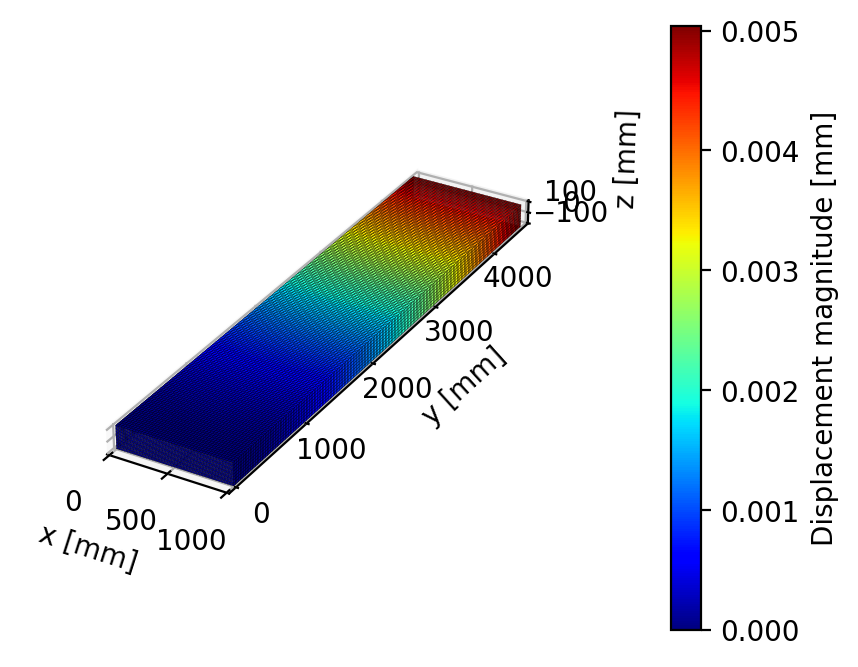

Buckling shape:


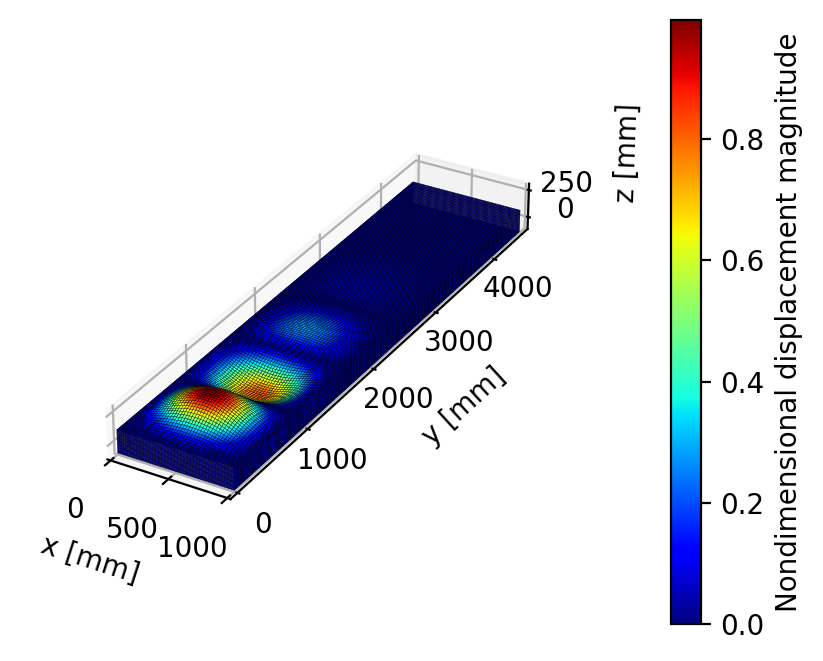

Buckling load: 1635 N

 Results for model with an applied load of 534 N


Nonlinear deformation:


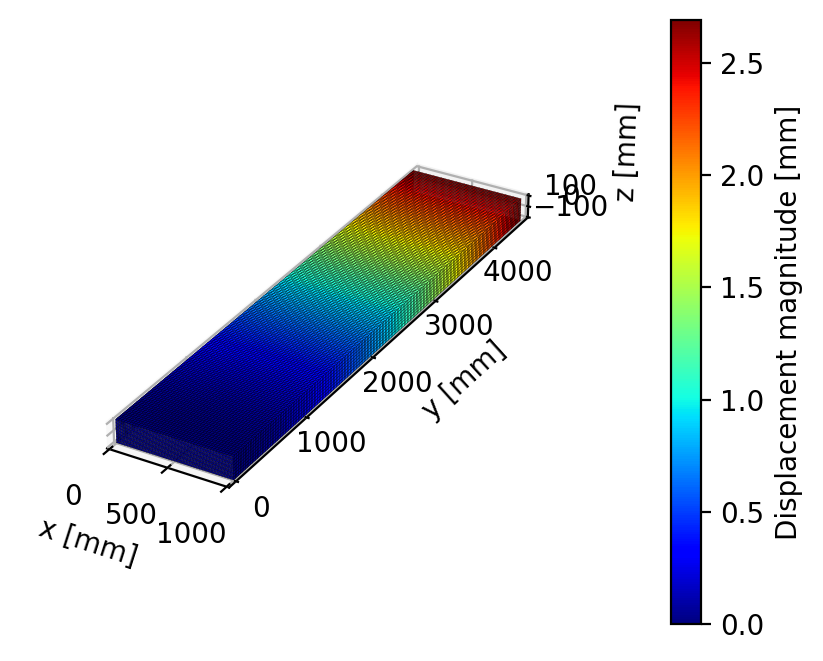

Buckling shape:


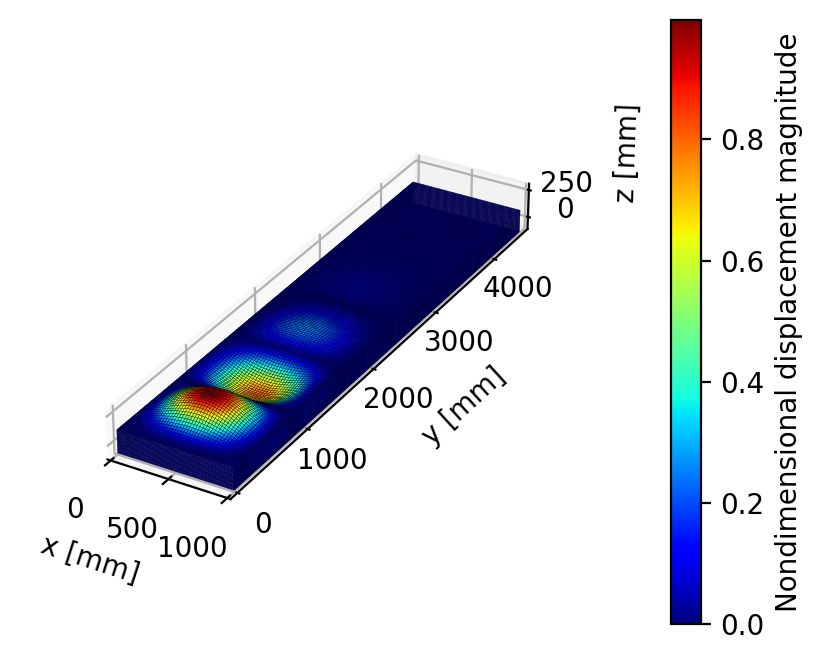

Buckling load: 1645 N

 Results for model with an applied load of 1067 N


Nonlinear deformation:


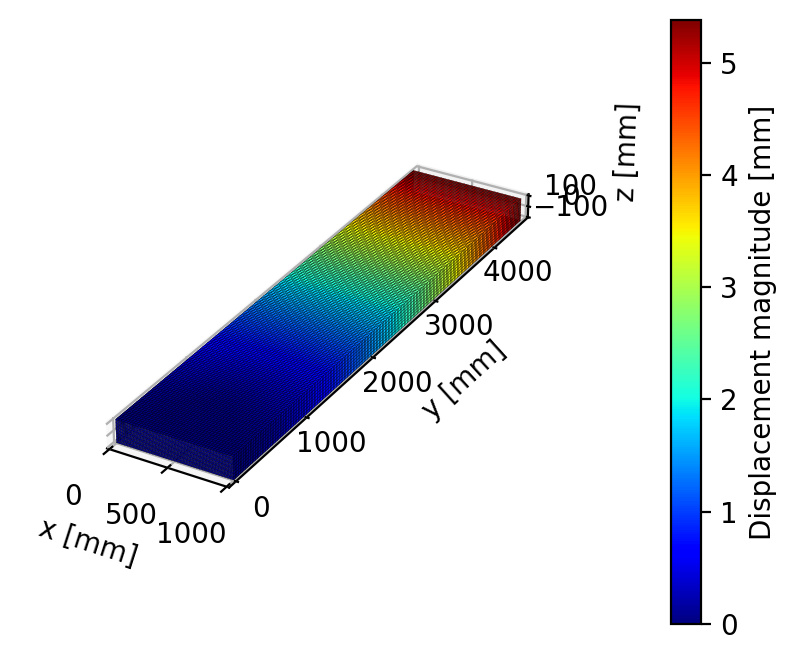

Buckling shape:


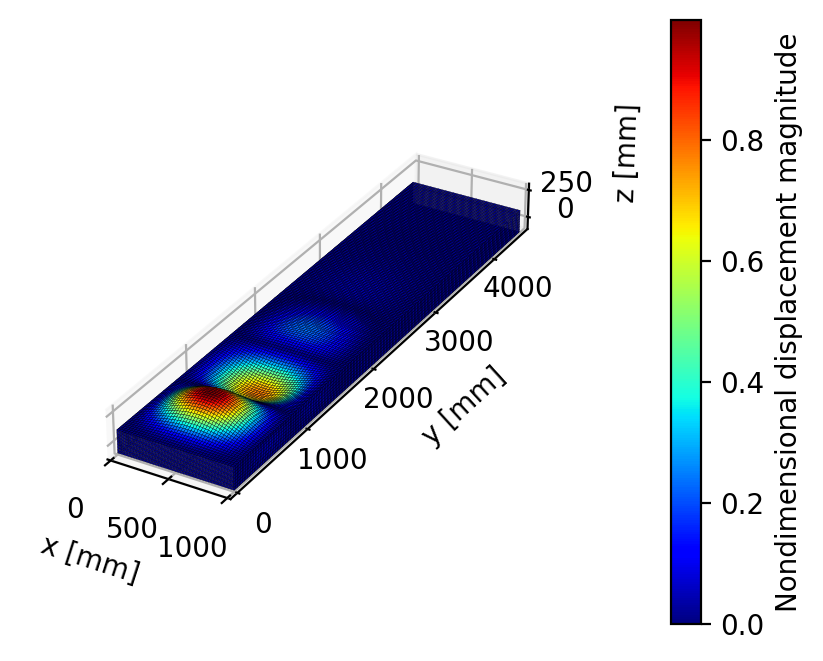

Buckling load: 1651 N

 Results for model with an applied load of 1600 N


Nonlinear deformation:


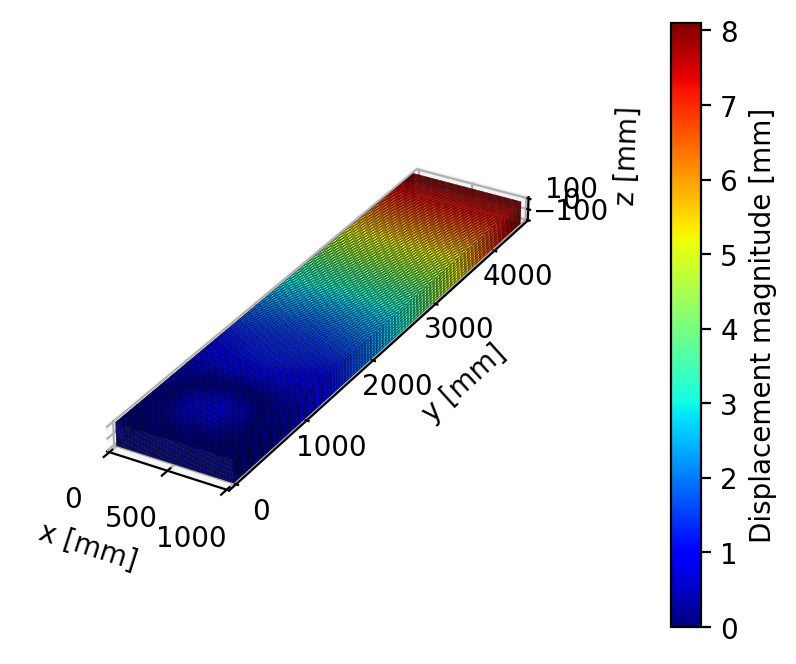

Buckling shape:


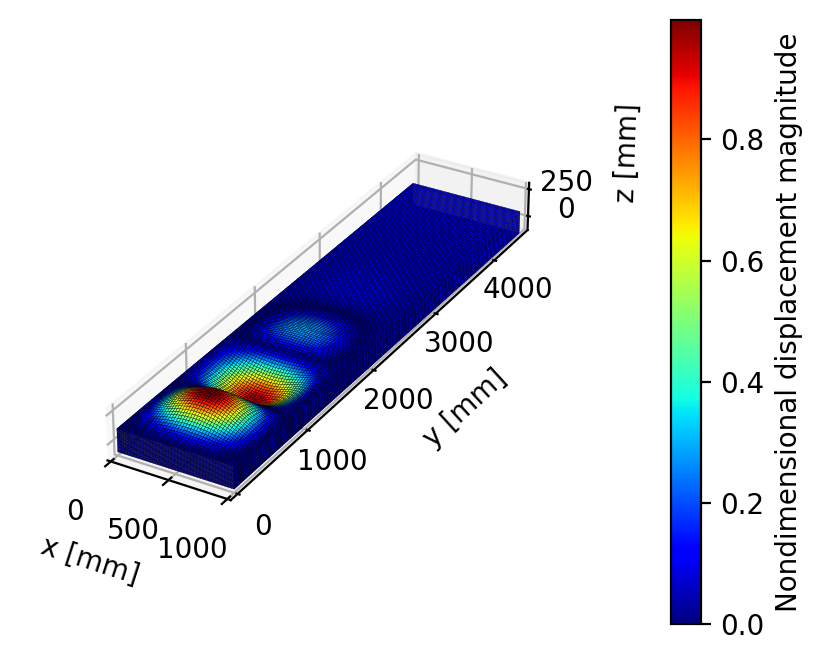

Buckling load: 1684 N


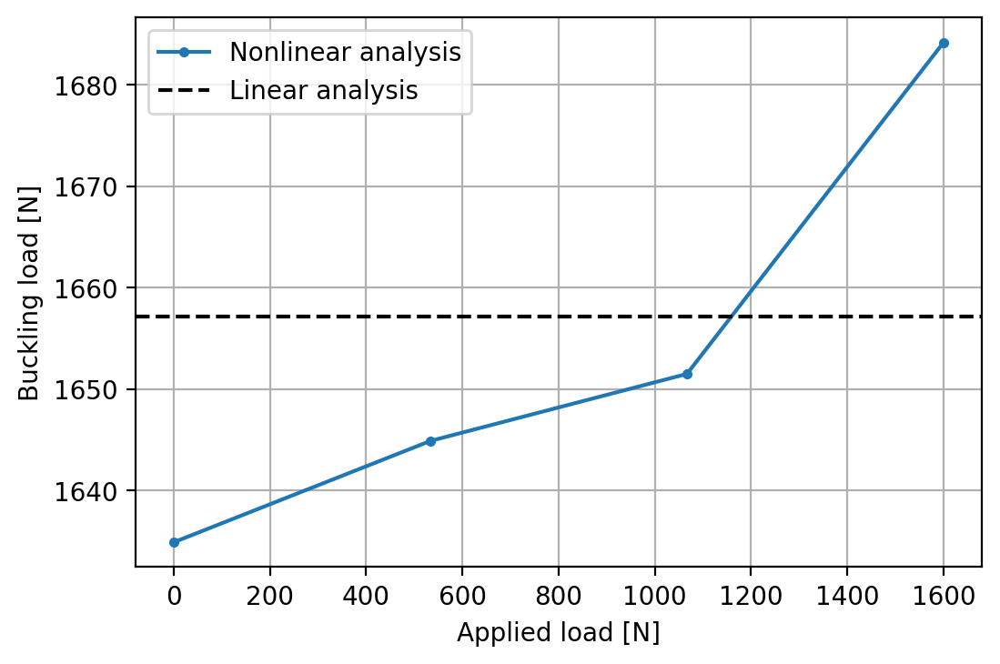

In [95]:
# Initialize array with nonlinear buckling loads
nonlinear_buckling_loads = np.empty(np.shape(applied_loads))
# Iterate through the applied loads
for i, applied_load in enumerate(applied_loads):
    # Calculate nonlinear buckling load and plot shape
    print(f'\n\033[1m Results for model with an applied load of {applied_load:.0f} N\033[0m')
    nonlinear_buckling_loads[i] = calculate_nonlinear_buckling_load(concentrated_load_rigid_tip_section_input.__deepcopy__({}), applied_load, plot_shape=True)
    print(f'Buckling load: {nonlinear_buckling_loads[i]:.0f} N')
# Plot nonlinear buckling loads vs applied loads
plot_buckling_loads(applied_loads, nonlinear_buckling_loads, linear_buckling_load)

In this case we can observe a global beam-like behavior for both the nonlinear deformation and the buckling shape. The displacement field of the nonlinear deformation is distributed from the root to the tip of the box beam for all the applied loads. Furthermore, the structure appears to have a linear response looking at the displacement peaks for the range of loads investigated. The buckling shape resembles closely the one predicted by the linear analysis for all the analyses. As far as the buckling loads are concerned, all values predicted by the nonlinear analysis are closer to the one predicted by the linear analysis but also here there is no clear convergence to a certain value.